# v0.4 FLX_US-Myb

Using a wavelet transform to partition FLUXNET-CH4 data into diffusive and ebullitive fluxes. 

Site: FLX_US-Myb

Knox et al. 2021 finds marshes have tight coupling of LE and FCH4 at the diel scale, through vegetative flux. Partitioning FCH4 by coupling/decoupling with LE could separate both diffusive and vegetative fluxes from ebullitive ones.

We want to examine the LE-FCH4 relationship shown in Knox et al. 2021, so we imitate the wavelet analysis of Knox et al. 2021 and Sturtevant et al. 2016.

- no normalization
- 14-level decomposition
- sum scales 1-2 (hourly), 3-6 (diel), 7-10 (multi-day), and 11-14 (seasonal)
- use gap-filled data, then reintroduce gaps prior to analysis (except for seasonal scale)
- use full time series for seasonal dynamics, use growing season for shorter-term
- Sturtevant et al. 2016 uses DOY 130-300 for 2013 growing season at US-Myb

We need a representative RMSD for non-eb fluxes (diff + veg) in order to partition eb fluxes. If diff + veg are driven by the same physics as LE, diff + veg flux wavelets could vary linearly with LE wavelets, especially on diel scale.

In [1]:
import pandas as pd
import numpy as np
import pywt
import wavefuncs as wave
import plotter as p

from cycler import cycler
from matplotlib import pyplot as plt
from matplotlib.dates import DateFormatter
import matplotlib.dates as mdates
from numpy.polynomial import Polynomial as P
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# global plotting settings
plt.style.use(['ggplot'])


default_cycler = (plt.rcParams['axes.prop_cycle'][:4]  +
                  cycler(linestyle=['-', '--', ':', '-.']))

plt.rcParams.update({'axes.grid' : True, 
                     'axes.facecolor' : 'white', 
                     'axes.edgecolor' : '.15',
                     'grid.color' : '.8',
                     'axes.prop_cycle' : default_cycler
                    })

# plt.rc('axes', prop_cycle=default_cycler)


In [2]:
site_id = 'US-Myb'

df = wave.read(f'FLX_{site_id}', method='file')

df = (df.replace(-9999, np.nan)
        .assign(date = lambda x: pd.to_datetime(x['TIMESTAMP_START'],
                                                format='%Y%m%d%H%M'))
        .set_index('date')
     )
#      # parse timestamp to new column 'date'
#     df = df.set_index(df['date'])
#      )

<AxesSubplot:xlabel='date'>

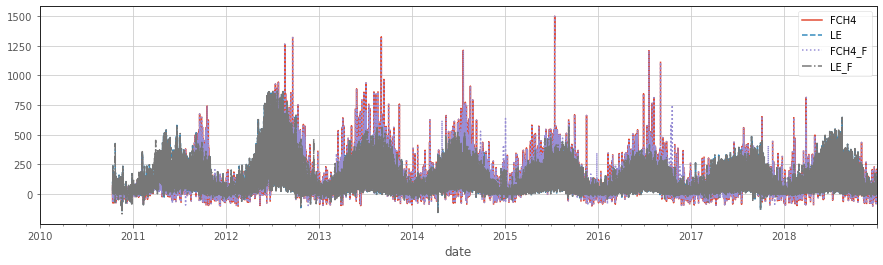

In [5]:
df[['FCH4', 'LE', 'FCH4_F', 'LE_F']].plot(figsize=(15,4), legend=True)

array([<AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>],
      dtype=object)

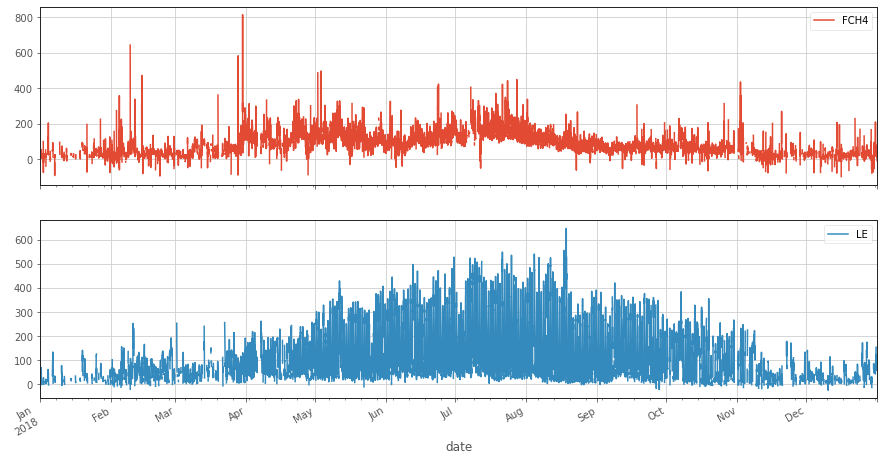

In [6]:
df.loc['2018', ['FCH4', 'LE']].plot(figsize=(15,8), subplots=True, legend=True)

array([<AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>],
      dtype=object)

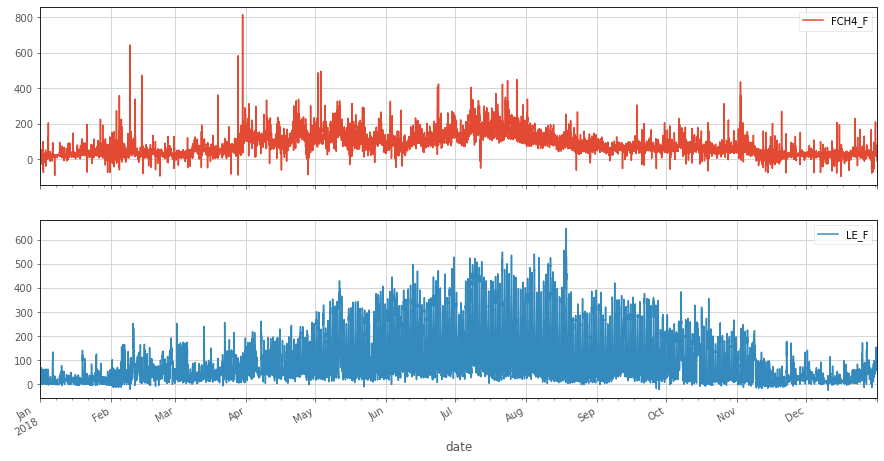

In [7]:
df.loc['2018', ['FCH4_F', 'LE_F']].plot(figsize=(15,8), subplots=True, legend=True)

### Wavelet decomposition

trim to where FCH4 gap-filled data is available, wavelet decompose full time series

In [3]:
df_full = df

df = df.loc[df['FCH4_F'].first_valid_index():df['FCH4_F'].last_valid_index()]

In [4]:
level = 13
wavelet = 'sym8'
cols = ['FCH4', 'LE']

In [5]:
for col in cols:
    c=wave.mra8(df[f'{col}_F'].to_numpy(), level=level, axis=0)
    df = df.join(pd.DataFrame(np.array(c).T, index=df.index, columns=[f'{col}_w{j}' for j in range(level+1)]))

array([<AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>],
      dtype=object)

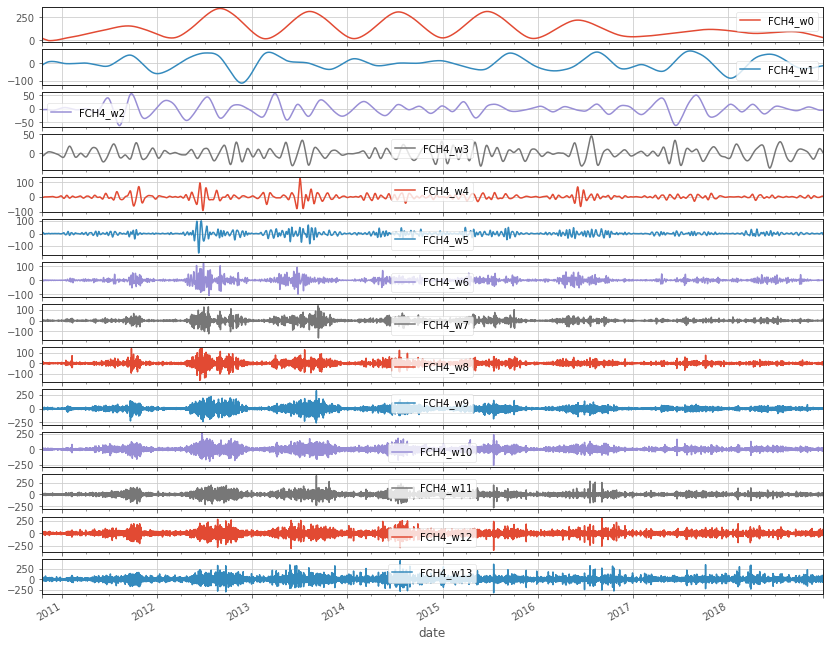

In [6]:
df.loc[:, 'FCH4_w0':'FCH4_w13'].plot(subplots=True, figsize=(14,12))

### sum wavelet scales

In [6]:
sumscales = [[0, 3],
             [4, 7],
             [8, 11],
             [12, 13]]

In [7]:
for col in cols:
    for j in range(len(sumscales)):
        df.loc[:, f'{col}_W{j}'] = df.loc[:, f'{col}_w{sumscales[j][0]}':f'{col}_w{sumscales[j][-1]}'].sum(axis=1)

array([<AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>],
      dtype=object)

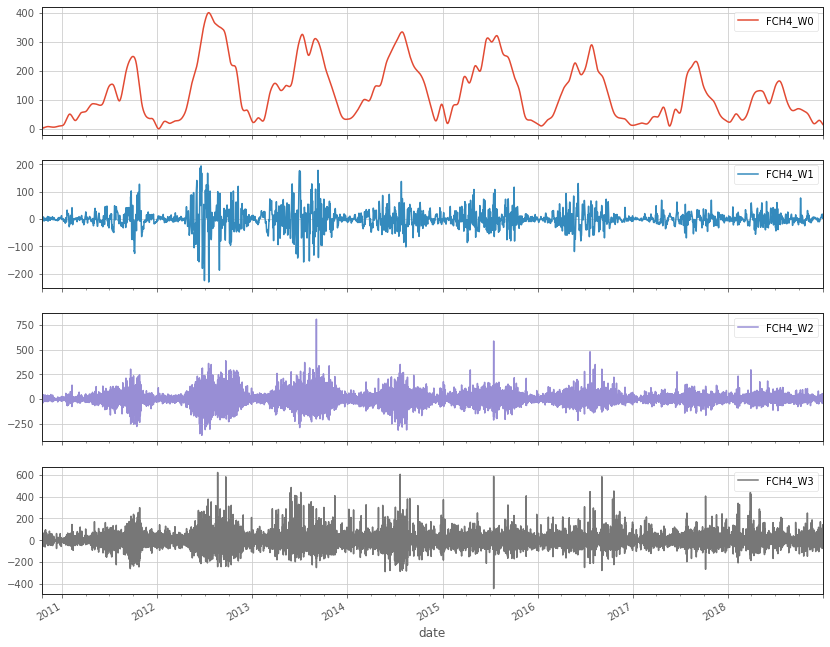

In [11]:
df.loc[:, 'FCH4_W0':'FCH4_W3'].plot(subplots=True, figsize=(14,12))

### LE_w vs FCH4_w for 2013 growing season.

In [8]:
grow13 = pd.DataFrame(df.loc[(df.index.year==2013) & (df.index.dayofyear.isin(range(130, 301)))])

plot LE-FCH4 for 2013 growing season

<AxesSubplot:xlabel='date'>

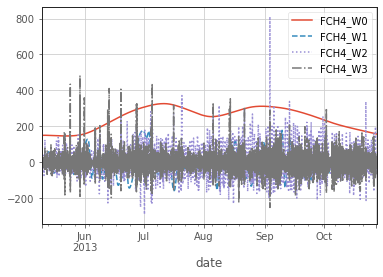

In [13]:
grow13.loc[:, 'FCH4_W0':'FCH4_W3'].plot()

<AxesSubplot:xlabel='LE_W3', ylabel='FCH4_W3'>

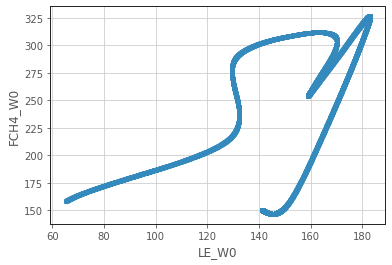

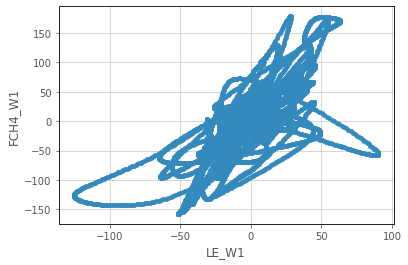

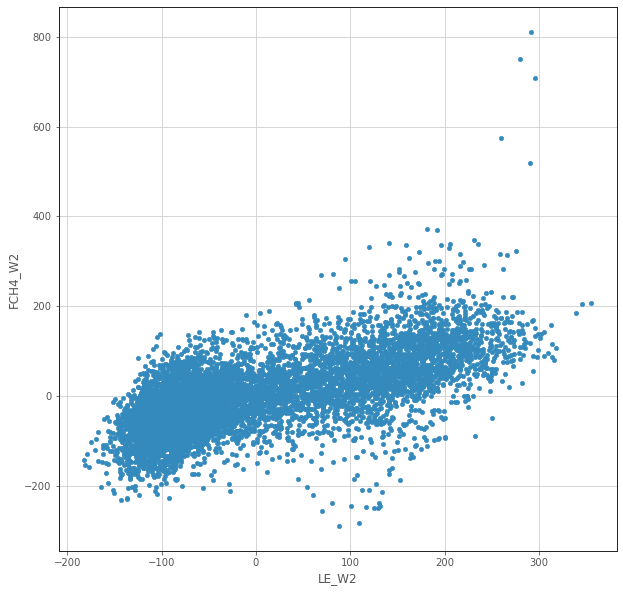

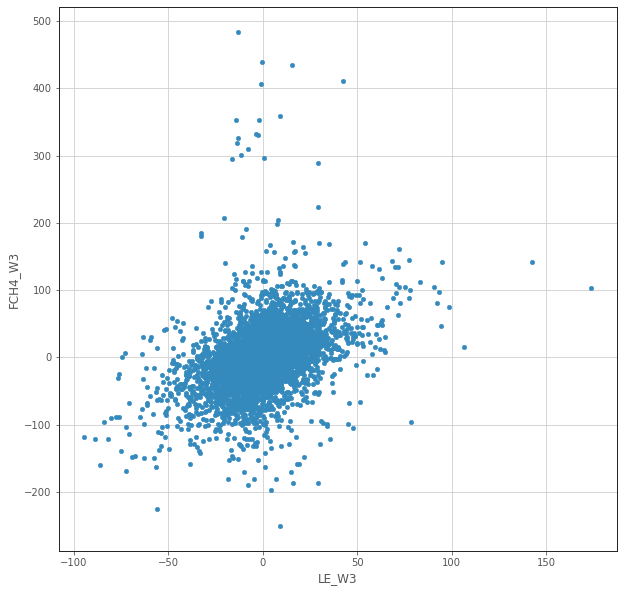

In [20]:
grow13.plot.scatter(y='FCH4_W0', x='LE_W0')
grow13.plot.scatter(y='FCH4_W1', x='LE_W1')
grow13.plot.scatter(y='FCH4_W2', x='LE_W2', figsize=(10,10))
grow13.plot.scatter(y='FCH4_W3', x='LE_W3', figsize=(10,10))

In [9]:
off13 = pd.DataFrame(df.loc['2012-10':'2013-05-01'])

plot LE-FCH4 for 2013 growing season

<AxesSubplot:xlabel='date'>

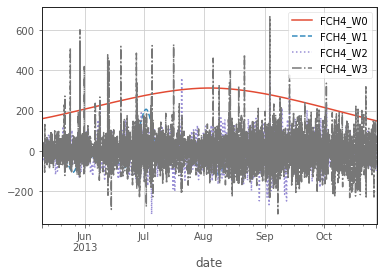

In [17]:
grow13.loc[:, 'FCH4_W0':'FCH4_W3'].plot()

<AxesSubplot:xlabel='LE_W3', ylabel='FCH4_W3'>

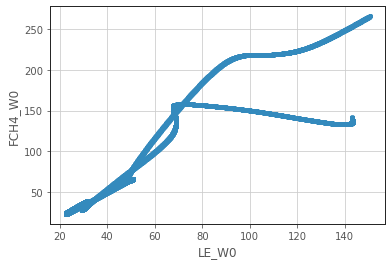

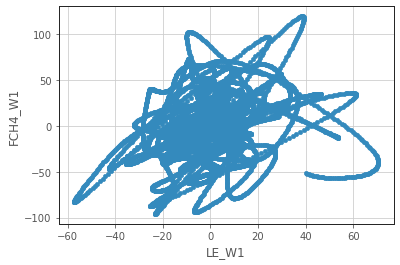

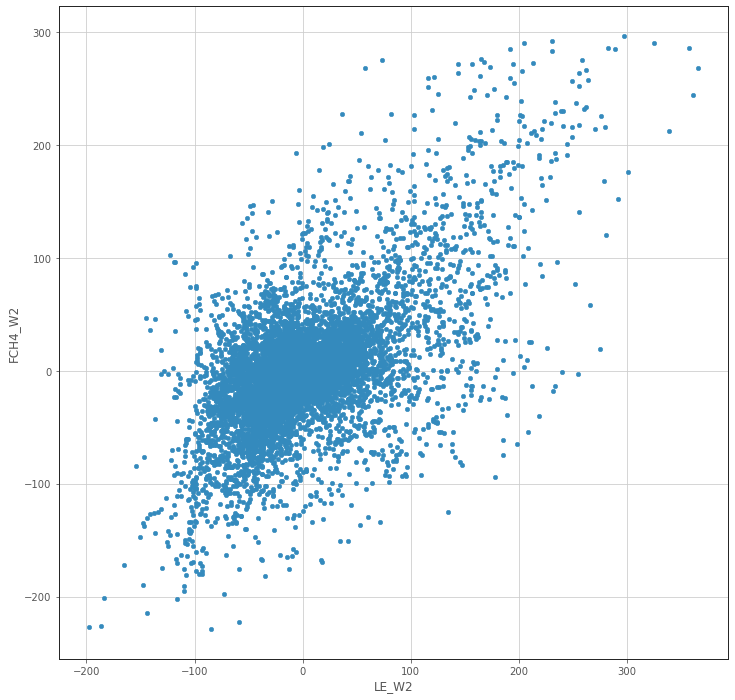

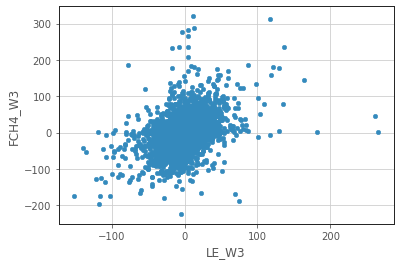

In [13]:
off13.plot.scatter(y='FCH4_W0', x='LE_W0')
off13.plot.scatter(y='FCH4_W1', x='LE_W1')
off13.plot.scatter(y='FCH4_W2', x='LE_W2', figsize=(12,12))
off13.plot.scatter(y='FCH4_W3', x='LE_W3')

### Reference RMSD

We need to select a deviation from diff + veg flux pattern to characterize ebullition.

- calculate RMSD in 1- 3day windows, to investigate diel variation.
- histogram of RMSDs
- select reference RMSD (0.5th percentile, or clearly non- eb period)

In [10]:
def get_rmsd(X,Y):
    '''Returns RMSD of linear fit between two Series
    '''
    
    X = X.to_numpy().reshape(-1, 1)
    Y = Y.to_numpy().reshape(-1, 1)
    
    pred = LinearRegression().fit(X, Y).predict(X)
    
    rmsd = np.sqrt(mean_squared_error(Y, pred))    
    
    return rmsd

In [11]:
group1d = grow13.groupby(grow13.index.date)

In [12]:
for name, group in group1d:
    X = group.LE_W2.to_numpy().reshape(-1, 1)
    Y = group.FCH4_W2.to_numpy().reshape(-1, 1)
    pred = LinearRegression().fit(X,Y).predict(X)
    grow13.loc[group.index, 'pred'] = pred
    grow13.loc[group.index, 'rmsd'] = np.sqrt(mean_squared_error(Y, pred))

In [13]:
rmsd_1d = group1d.apply(lambda x: get_rmsd(x['LE_W2'], x['FCH4_W2']))

In [14]:
rmsd_1d.describe()

count    171.000000
mean      45.079026
std       19.564736
min        8.558993
25%       30.656892
50%       41.975121
75%       55.913625
max      126.800612
dtype: float64

In [15]:
group1d.rmsd.mean().describe()

count    171.000000
mean      45.079026
std       19.564736
min        8.558993
25%       30.656892
50%       41.975121
75%       55.913625
max      126.800612
Name: rmsd, dtype: float64

array([<AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>], dtype=object)

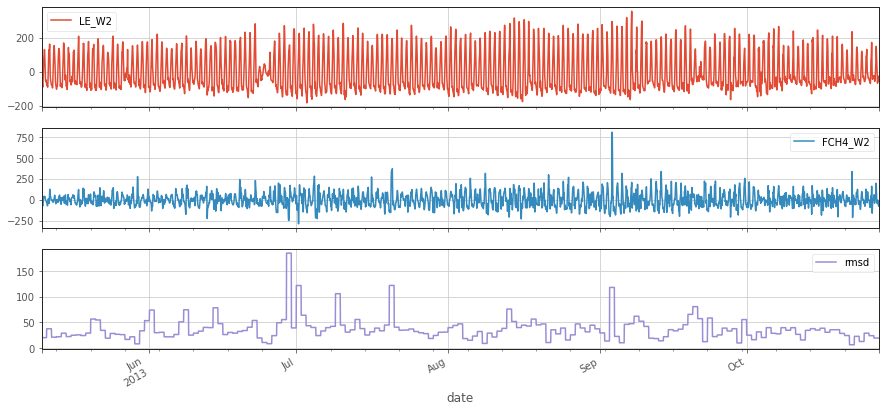

In [62]:
grow13[['LE_W2', 'FCH4_W2', 'rmsd']].plot(figsize=(15,7), subplots=True)

In [52]:
rmsd_ref = rmsd_1d.quantile(0.05)

maskmore = grow13.loc[:, 'FCH4_W2'] > grow13.loc[:, 'pred'] - 3 * rmsd_ref
maskless = grow13.loc[:, 'FCH4_W2'] < grow13.loc[:, 'pred'] + 3 * rmsd_ref

grow13.loc[:, 'ebull'] = ~(maskmore & maskless)

<AxesSubplot:xlabel='date'>

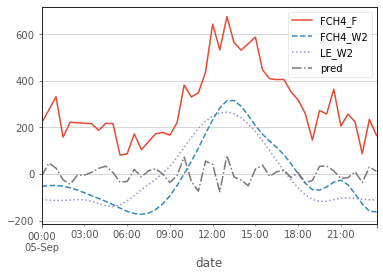

In [24]:
grow13.loc['2013-09-05', ['FCH4_F', 'FCH4_W2', 'LE_W2', 'pred']].plot()

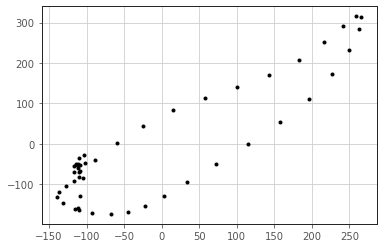

In [26]:
day=grow13.loc['2013-09-05']

fig, ax = plt.subplots()

ax.plot(day['LE_W2'], day['FCH4_W2'], 'k.')
# ax.plot(day['LE_W2'], day['pred'], 'r-')
# ax.plot(day['LE_W2'], day['pred'] + 3*rmsd_ref, 'r--')
# ax.plot(day['LE_W2'], day['pred'] - 3*rmsd_ref, 'r--')

scatter for all days that have "low rmsd"

In [31]:

days = grow13.loc[grow13.rmsd < rmsd_1d.quantile(0.1)]

ax.plot(days['LE_W2'], days['FCH4_W2'], 'k.')

In [28]:
for name, group in group1d:
    X = group.LE_W3.to_numpy().reshape(-1, 1)
    Y = group.FCH4_W3.to_numpy().reshape(-1, 1)
    pred = LinearRegression().fit(X,Y).predict(X)
    grow13.loc[group.index, 'pred'] = pred
    grow13.loc[group.index, 'rmsd'] = np.sqrt(mean_squared_error(Y, pred))

In [17]:
rmsd_1d = group1d.apply(lambda x: get_rmsd(x['LE_W3'], x['FCH4_W3']))

In [18]:
rmsd_1d.describe()

count    171.000000
mean      31.873463
std       16.015951
min        7.343104
25%       22.335404
50%       26.959487
75%       37.175820
max      100.882225
dtype: float64

In [19]:
group1d.rmsd.mean().describe()

count    171.000000
mean      31.873463
std       16.015951
min        7.343104
25%       22.335404
50%       26.959487
75%       37.175820
max      100.882225
Name: rmsd, dtype: float64

array([<AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>], dtype=object)

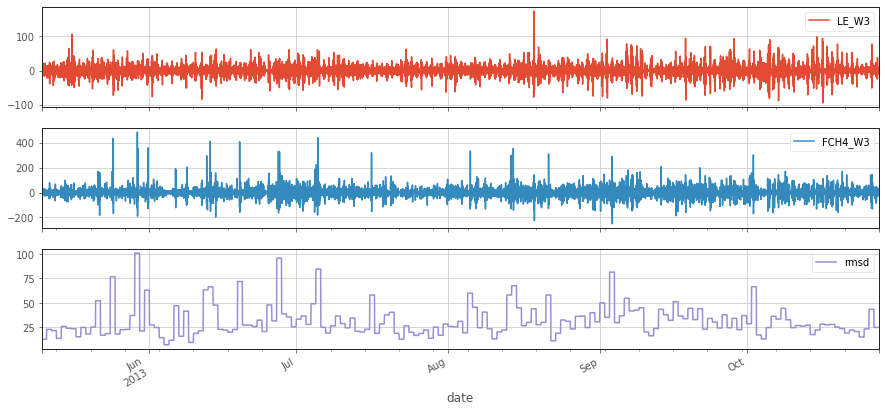

In [20]:
grow13[['LE_W3', 'FCH4_W3', 'rmsd']].plot(figsize=(15,7), subplots=True)

In [21]:
rmsd_ref = rmsd_1d.quantile(0.05)

maskmore = grow13.loc[:, 'FCH4_W3'] > grow13.loc[:, 'pred'] - 3 * rmsd_ref
maskless = grow13.loc[:, 'FCH4_W3'] < grow13.loc[:, 'pred'] + 3 * rmsd_ref

grow13.loc[:, 'ebull'] = ~(maskmore & maskless)

<AxesSubplot:xlabel='date'>

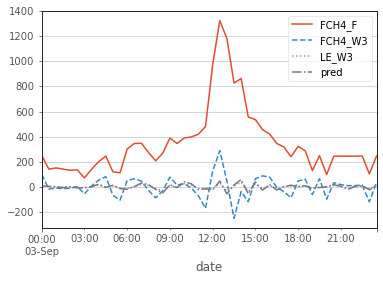

In [22]:
grow13.loc['2013-09-03', ['FCH4_F', 'FCH4_W3', 'LE_W3', 'pred']].plot()

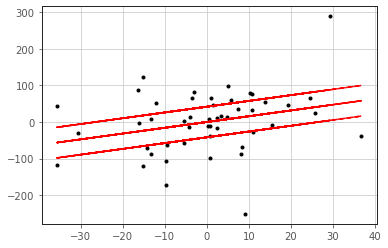

In [23]:
day=grow13.loc['2013-09-03']

fig, ax = plt.subplots()

ax.plot(day['LE_W3'], day['FCH4_W3'], 'k.')
ax.plot(day['LE_W3'], day['pred'], 'r-')
ax.plot(day['LE_W3'], day['pred'] + 3*rmsd_ref, 'r--')
ax.plot(day['LE_W3'], day['pred'] - 3*rmsd_ref, 'r--')

<AxesSubplot:xlabel='date'>

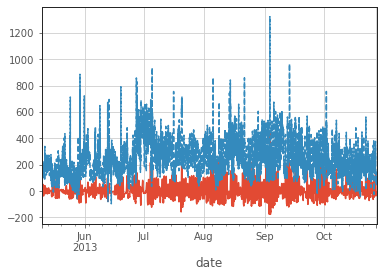

In [63]:
grow13.pred.plot()
grow13.FCH4_F.plot()

<AxesSubplot:xlabel='LE_W2', ylabel='FCH4_F'>

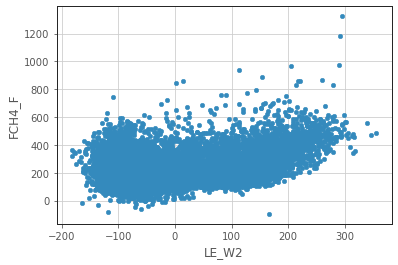

In [60]:
grow13.plot.scatter(x='LE_W2', y='FCH4_F')

<AxesSubplot:xlabel='date'>

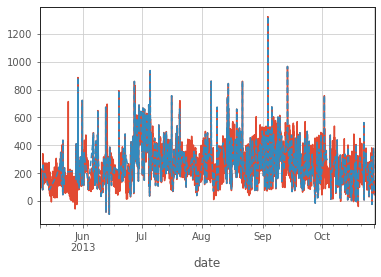

In [56]:
grow13.loc[:, 'FCH4_F'].plot()
grow13.loc[grow13['ebull']==True, 'FCH4_F'].plot()

In [ ]:
grow13.loc[:, 'ebull'] = )

In [41]:
group1d.dev = group1d.apply(lambda x: x.FCH4_W2 - x.pred)

AttributeError: 'DataFrame' object has no attribute 'pred'

In [30]:
rmsds_1d = group1d.apply(lambda x: get_rmsd(x['LE_W2'], x['FCH4_W2']))

ValueError: too many values to unpack (expected 2)

In [28]:
regr_1d

2013-05-10    ([[-29.585177252047718], [-31.773966525921455]...
2013-05-11    ([[-17.20162939798295], [-18.09053660602389], ...
2013-05-12    ([[-17.059677757302058], [-17.053275721681867]...
2013-05-13    ([[-19.122610443527577], [-19.554031098077658]...
2013-05-14    ([[4.958994395818868], [4.973949475284761], [4...
                                    ...                        
2013-10-23    ([[-18.031576661205364], [-19.203847642204252]...
2013-10-24    ([[-48.58879676336946], [-48.8792006520906], [...
2013-10-25    ([[-11.887912557443839], [-13.615117876397333]...
2013-10-26    ([[-45.24888712232496], [-47.66015983544854], ...
2013-10-27    ([[-4.887019161312018], [-2.623527406734894], ...
Length: 171, dtype: object

can get a date-indexed Series of rmsds, now need to choose 0.5th quantile and apply partition

In [69]:
rmsds_1d.quantile(0.05)

19.364547896384188

<AxesSubplot:>

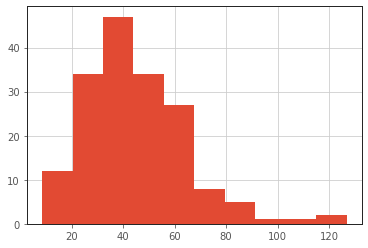

In [18]:
rmsds_1d.hist()

In [16]:
rmsds_1d.quantile(0.05)

19.364547896384188

In [23]:
for name, group in group1d:
    wave_arr = group.FCH4_W2
    
    

In [ ]:
    regr = LinearRegression().fit(X, Y)
    
    pred = regr.predict(X)
    rmsd = np.sqrt(mean_squared_error(Y, pred))

## junk

In [36]:
waves = (pd.DataFrame(np.array(cM).T, index=df.index, columns=[f'wm{j+1}' for j in range(level+1)])
         .join(pd.DataFrame(np.array(cLE).T, index=df.index, columns = [f'wq{j+1}' for j in range(level+1)]))
          .assign(FCH4_hour = lambda x: np.sum([x[f'wm{j}'] for j in range(1,3)]), 
                  FCH4_diel = lambda x: np.sum([x[f'wm{j}'] for j in range(3, 7)]), 
                  FCH4_mday = lambda x: np.sum([x[f'wm{j}'] for j in range(7, 11)]), 
                  FCH4_seas = lambda x: np.sum([x[f'wm{j}'] for j in range(11, 14)]), 
                  LE_hour = lambda x: np.sum([x[f'wq{j}'] for j in range(1,3)]), 
                  LE_diel = lambda x: np.sum([x[f'wq{j}'] for j in range(3, 7)]), 
                  LE_mday = lambda x: np.sum([x[f'wq{j}'] for j in range(7, 11)]), 
                  LE_seas = lambda x: np.sum([x[f'wq{j}'] for j in range(11, 14)])
                 
                 )
        )

scales not summing correctly here!

array([<AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>],
      dtype=object)

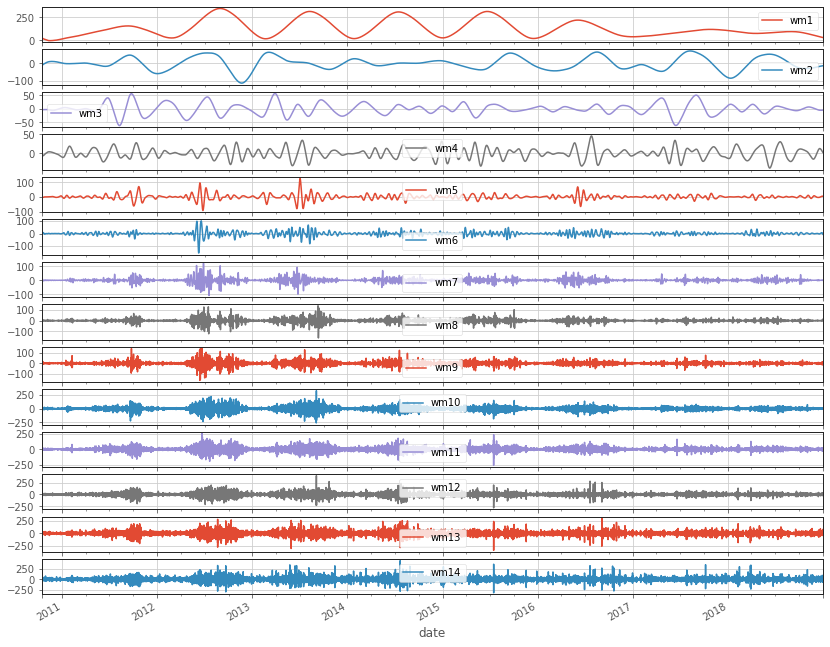

In [46]:
waves.loc[:, 'wm1':'wm14'].plot(subplots=True, figsize=(14,12))

array([<AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>],
      dtype=object)

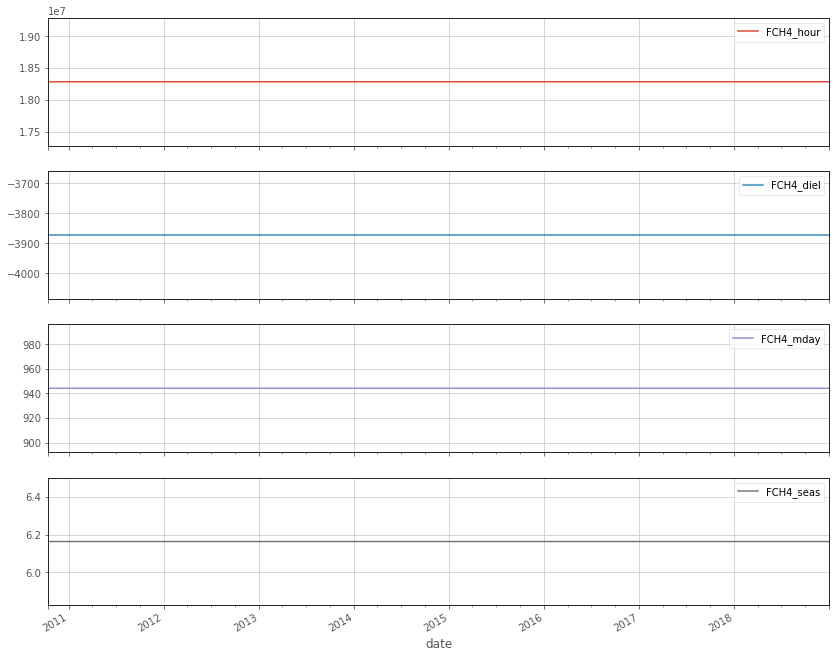

In [48]:
waves.loc[:, 'FCH4_hour':'FCH4_seas'].plot(subplots=True, figsize=(14,12))

In [37]:
df = df.assign(**waves.loc[:, waves.columns[waves.columns.str.startswith('FCH4_')]])
df = df.assign(**waves.loc[:, waves.columns[waves.columns.str.startswith('LE_')]])

In [15]:
waves = (pd.concat([pd.DataFrame(np.array(cM).T, index=df.index, columns=[f'wm{j+1}' for j in range(level+1)]), 
                 pd.DataFrame(np.array(cLE).T, index=df.index, columns = [f'wq{j+1}' for j in range(level+1)])
                 ]
                )
        )

In [29]:
wavesm = pd.DataFrame(np.array(cM).T, index=df.index, columns=[f'w{j+1}' for j in range(level+1)])
wavesq = pd.DataFrame(np.array(cLE).T, index=df.index, columns=[f'w{j+1}' for j in range(level+1)])

In [19]:
df.assign(FCH4_hour = waves[[f'wm{j}' for j in range(1,3)]], 
          FCH4_diel = waves[[f'wm{j}' for j in range(3, 7)]], 
          FCH4_mday = waves[[f'wm{j}' for j in range(7, 11)]], 
          FCH4_seas = waves[[f'wm{j}' for j in range(11, 14)]], 
          LE_hour = waves[[f'wq{j}' for j in range(1,3)]], 
          LE_diel = waves[[f'wq{j}' for j in range(3, 7)]], 
          LE_mday = waves[[f'wq{j}' for j in range(7, 11)]], 
          LE_seas = waves[[f'wq{j}' for j in range(11, 14)]]
         )

ValueError: cannot reindex from a duplicate axis

In [9]:
waves = (pd.DataFrame(np.array(cM).T, index=df.index, 
                    columns=[f'w{j+1}' for j in range(level+1)])
          .assign(FCH4_hour = lambda x: np.sum([x[f'w{j}'] for j in range(1,3)]), 
                  FCH4_diel = lambda x: np.sum([x[f'w{j}'] for j in range(3, 7)]), 
                  FCH4_mday = lambda x: np.sum([x[f'w{j}'] for j in range(7, 11)]), 
                  FCH4_seas = lambda x: np.sum([x[f'w{j}'] for j in range(11, 14)])
                 )
       )

todo instead, assign summed scales to df, leave waves as original wavelets 

# ~5d window, LA8 wavelet
- break timeseries into windows of 239 samples (~5 days)
- choose 'low ebullition' period with low RMSD for reference
- partition other windows using ref RMSD

In [7]:
windows = wave.chop(df, samples = 239)

In [8]:
for i in range(len(windows)):
    df.loc[windows[i], 'window'] = i 

In [9]:
# Scales separated

for window in windows:
    dfw = df.loc[window, :]
    dfp = wave.proc(dfw, level=3, sum_scales=False)
    
    # choose columns for partitioning
    Xcols = dfp.columns[dfp.columns.str.startswith('LE_w')]
    Ycols = dfp.columns[dfp.columns.str.startswith('FCH4_w')]
    
    plt.close('all')
    fig, ax = plt.subplots(len(Xcols) // 2, 2, figsize=(12,12), sharex=True, sharey=True)
    
    bigax = fig.add_subplot(111, frameon=False)
    bigax.grid(False)
    bigax.tick_params(labelcolor='none', which='both', top=False, bottom=False,
                  left=False, right=False)

    bigax.set(xlabel='LE wavelet coeff', ylabel='FCH4 wavelet coeff', 
              title='{} {} - {}'.format(site_id, window[0], window[-1]))
        
    for j in range(len(Xcols)):
        
        # calc regression
        pred, rmsd, r2 = wave.get_regr(dfp, Xcols[j], Ycols[j])
        
        df.loc[dfp.index, 'pred_{}'.format(j)] = pred
        df.loc[dfp.index, 'rmsd_{}'.format(j)] = np.ones(len(dfp)) * rmsd
        df.loc[dfp.index, 'r2_{}'.format(j)] = np.ones(len(dfp)) * r2
        
        ax[j // 2, j % 2].plot(dfp[Xcols[j]], dfp[Ycols[j]], 'k.',
                               dfp[Xcols[j]], pred, 'r-', 
                               dfp[Xcols[j]], pred + 3 * rmsd, 'r--', 
                               dfp[Xcols[j]], pred - 3 * rmsd, 'r--')
    
    plt.tight_layout()

    filename = 'plot/20210908/20210908_{}_iwata7_5d_{}_{}_{}.jpeg'.format(site_id, window[0].year, window[0].month, window[0].day)
    plt.savefig(filename)
    
    df.loc[window, Xcols] = dfp[Xcols]
    df.loc[window, Ycols] = dfp[Ycols]

    plt.close()

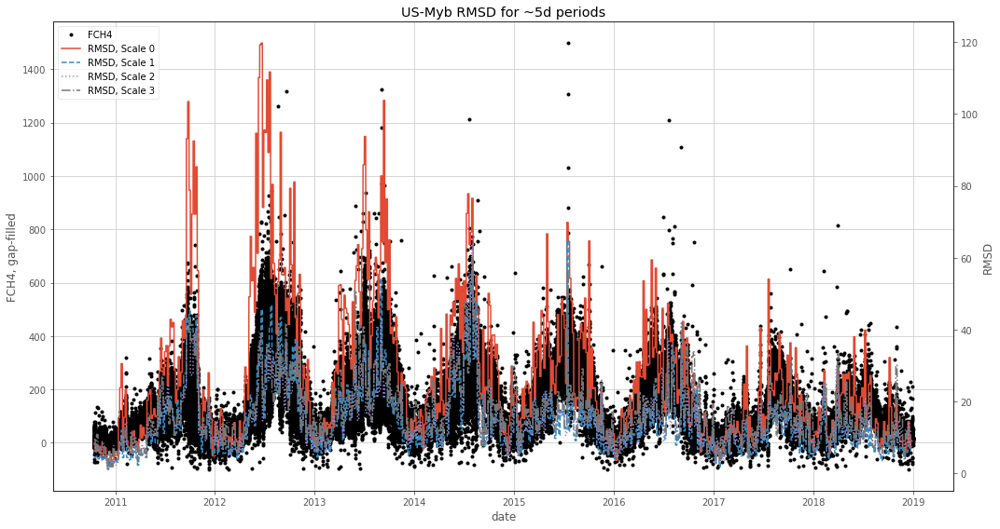

In [13]:
filename = f'plot/20210908/20210908_{site_id}_5d_rmsd_vs_date.jpeg'
# filename = None
p.date_rmsd(df, title = f'{site_id} RMSD for ~5d periods', 
            filename = filename,
            figsize=(15,8)
           )

# shorter intervals

We think the ebullitive/diffusive signal is more distinguishable at finer timescales. If we avoid summing adjacent scales or use the Haar wavelet instead of LA8, we can shorten the usable window.

In [28]:
pywt.dwt_max_level(8, pywt.Wavelet('haar').dec_len)

3

In [96]:
pywt.dwt_max_level(239, pywt.Wavelet('sym8').dec_len)

3

# LA8 wavelet
- break timeseries into windows of 239 samples (~5 days)
- choose 'low ebullition' period with low RMSD for reference
- partition other windows using ref RMSD

In [2]:
site_id = 'JP-BBY'

df = wave.read('FLX_{}'.format(site_id), method='file')

df = df.replace(-9999, np.nan) # replace missing with nan
df['date'] = pd.to_datetime(df['TIMESTAMP_START'], format='%Y%m%d%H%M') # parse timestamp to new column 'date'
df = df.set_index(df['date'])

<AxesSubplot:title={'center':'2015 - 2018 JP-BBY'}, xlabel='date', ylabel='FCH4, gap-filled'>

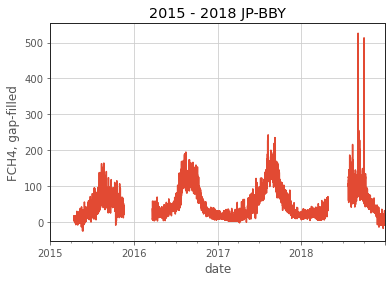

In [3]:
df['FCH4_F'].plot(ylabel = 'FCH4, gap-filled', 
                  title=f'{df.index[0].year} - {df.index[-1].year} {site_id}')

In [4]:
windows = wave.chop(df, samples = 239)

In [5]:
for i in range(len(windows)):
    df.loc[windows[i], 'window'] = i 

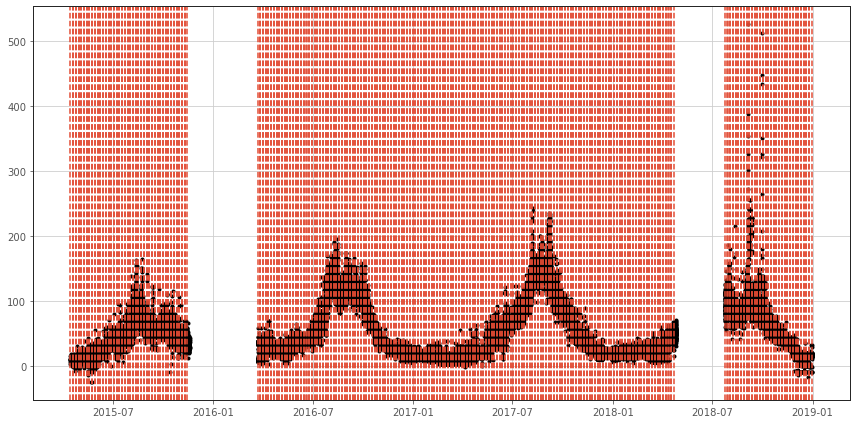

In [6]:
fig, ax = plt.subplots(figsize=(12,6))

ax.plot(df.index, df.loc[df.index, 'FCH4_F'], 'k.')
for w in windows:
    ax.axvline(w[0], ls='--')
    ax.axvline(w[-1], ls='--')

fig.tight_layout()

can now rebuild this with groupby('window')

In [7]:
# Scales separated

for window in windows:
    dfw = df.loc[window, :]
    dfp = wave.proc(dfw, level=3, sum_scales=False)
    
    # choose columns for partitioning
    Xcols = dfp.columns[dfp.columns.str.startswith('LE_w')]
    Ycols = dfp.columns[dfp.columns.str.startswith('FCH4_w')]
    
    plt.close('all')
    fig, ax = plt.subplots(len(Xcols) // 2, 2, figsize=(12,12), sharex=True, sharey=True)
    
    bigax = fig.add_subplot(111, frameon=False)
    bigax.grid(False)
    bigax.tick_params(labelcolor='none', which='both', top=False, bottom=False,
                  left=False, right=False)

    bigax.set(xlabel='LE wavelet coeff', ylabel='FCH4 wavelet coeff', 
              title='{} {} - {}'.format(site_id, window[0], window[-1]))
        
    for j in range(len(Xcols)):
        
        # calc regression
        pred, rmsd, r2 = wave.get_regr(dfp, Xcols[j], Ycols[j])
        
        df.loc[dfp.index, 'pred_{}'.format(j)] = pred
        df.loc[dfp.index, 'rmsd_{}'.format(j)] = np.ones(len(dfp)) * rmsd
        df.loc[dfp.index, 'r2_{}'.format(j)] = np.ones(len(dfp)) * r2
        
        ax[j // 2, j % 2].plot(dfp[Xcols[j]], dfp[Ycols[j]], 'k.',
                               dfp[Xcols[j]], pred, 'r-', 
                               dfp[Xcols[j]], pred + 3 * rmsd, 'r--', 
                               dfp[Xcols[j]], pred - 3 * rmsd, 'r--')
    
    plt.tight_layout()

    filename = 'plot/20210821/no_sum/20210821_{}_short_iwata7_{}_{}_{}.jpeg'.format(site_id, window[0].year, window[0].month, window[0].day)
#     plt.savefig(filename)
    
    df.loc[window, Xcols] = dfp[Xcols]
    df.loc[window, Ycols] = dfp[Ycols]

    plt.close()

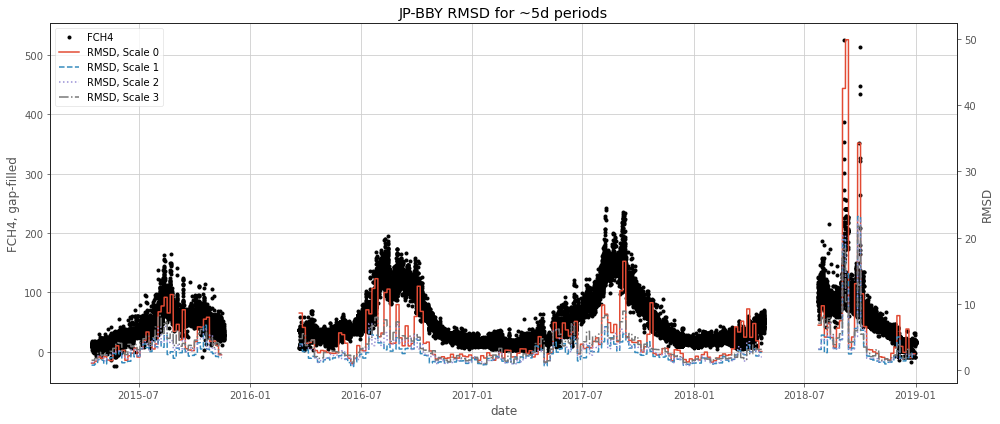

In [8]:
# filename = f'plot/20210821/no_sum/20210821_{site_id}_short_rmsd_vs_date.jpeg'
filename = None
p.date_rmsd(df, title = f'{site_id} RMSD for ~5d periods', 
            filename = filename,
            figsize=(14,6)
           )

<AxesSubplot:xlabel='date'>

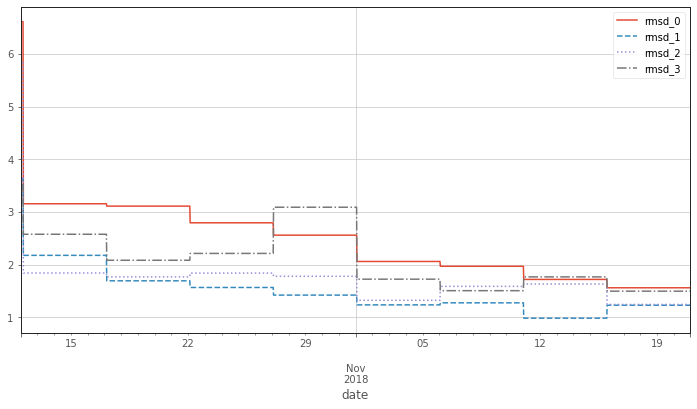

In [9]:
df.loc['2018-10-12':'2018-11-20', [f'rmsd_{j}' for j in range(len(Xcols))]].plot(figsize=(12,6))

In [10]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(df.loc['2018-10-12':'2018-11-20'].cov()['FCH4_w0':'FCH4_w3'])

         TIMESTAMP_START  TIMESTAMP_END       NEE           H          LE  \
FCH4_w0      9168.961618    6848.246733 -7.061550  338.597683  193.098251   
FCH4_w1      -261.149071    -841.588278 -0.026164   22.533114   13.889643   
FCH4_w2      -371.265203   -1069.340823 -0.243790   15.172305   13.331253   
FCH4_w3     -1114.976527   -4924.951730  0.153134   15.968516    9.416813   

              FCH4     USTAR       SW_IN      SW_OUT     LW_IN      LW_OUT  \
FCH4_w0  63.134449  0.131920  851.462002  144.587138  1.686216  130.989774   
FCH4_w1   8.501932  0.008448   48.268091    7.383468 -2.466370    3.745457   
FCH4_w2  10.276562  0.007191   22.379073    3.739163 -2.130858    1.303826   
FCH4_w3  17.041007  0.007886   20.387141    3.610432 -0.751192    1.124217   

             NETRAD      PPFD_IN       VPD         RH        PA         TA  \
FCH4_w0  522.268855  1364.154725  9.637986 -58.256814 -0.152533  15.914381   
FCH4_w1   23.859446    67.615832  0.157717  -0.861057  0.000807   0

In [11]:
rmsds = (df.groupby('window')
 [df.columns[df.columns.str.startswith('rmsd')]]
 .mean()
)

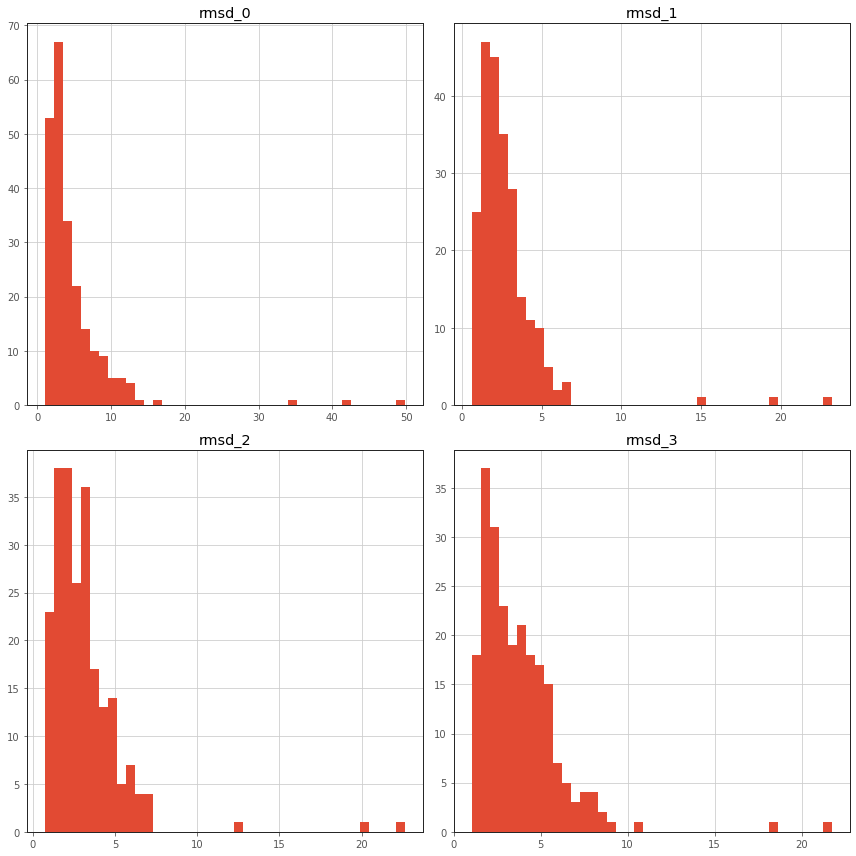

In [12]:
fig, ax = plt.subplots(len(Xcols) // 2, 2, figsize = (12, 12))

rmsds.hist(ax=ax, bins = 40, figsize=(12,12), log=False)

# for i in range(len(Xcols)):
#     ax[i].axvline(rmsds[i].quantile(0.95))

filename = 'plot/20210902/20210902_{}_rmsd_hist.jpeg'.format(site_id, window[0].year, window[0].month, window[0].day)
plt.savefig(filename)
    

plt.tight_layout()


all four scales have ~three outliers, can I check if they're all the same event?

filter for rmsd > limit? filter for quantile

In [13]:
rmsds.quantile(0.05)

rmsd_0    1.543098
rmsd_1    1.009280
rmsd_2    1.143019
rmsd_3    1.441226
Name: 0.05, dtype: float64

In [ ]:
[df.loc[window, [f'rmsd_{j}' for j in range(len(Xcols))]].mean() for window in windows[-12:-10]]

for ref, use mean of 5th percentiles of rmsds over all windows 

In [13]:
df = wave.partition(df, windows, rmsd=rmsds.quantile(0.05).mean())

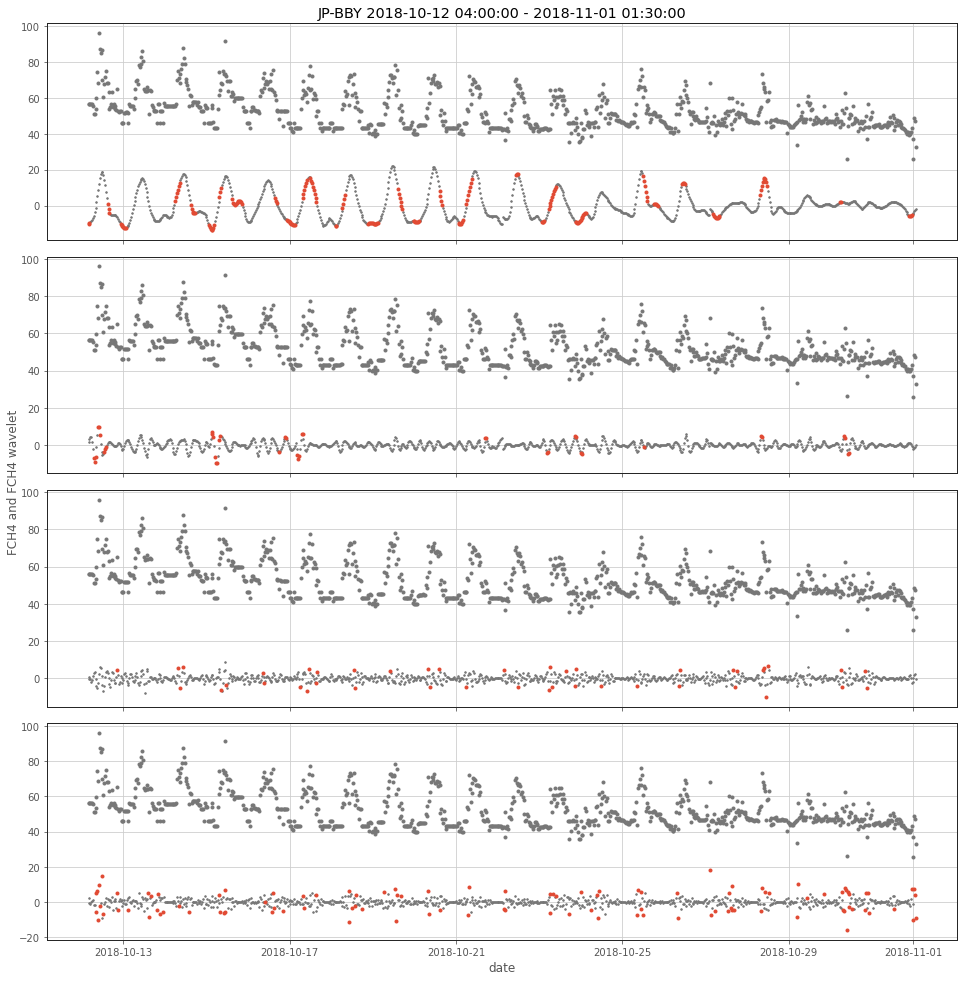

In [55]:
# Choose window and columns to plot

dfw = df.loc[df['window'].isin(range(212,216))]

cols = df.columns[df.columns.str.startswith('FCH4_w')]

# mask for ebullitive fluxes
mask = [dfw[f'ebull_{j}']==True for j in range(len(cols))]

plt.close('all')
fig, ax = plt.subplots(len(cols), 1, figsize=(14,14), sharex=True, sharey=False)

bigax = fig.add_subplot(111, frameon=False)
bigax.grid(False)
bigax.tick_params(labelcolor='none', which='both', top=False, bottom=False,
              left=False, right=False)
bigax.set(ylabel='FCH4 and FCH4 wavelet', title=f'{site_id} {dfw.index[0]} - {dfw.index[-1]}')

colors = list(plt.rcParams['axes.prop_cycle'])

for j in range(len(cols)):
    ax[j].plot(dfw[f'FCH4_F'], '.', color=colors[-1]['color'])
    ax[j].plot(dfw[f'FCH4_w{j}'], '.',color=colors[3]['color'], label='diffusive', markersize=3)
    ax[j].plot(dfw.loc[mask[j]].index, dfw.loc[dfw.loc[mask[j]].index, f'FCH4_w{j}'], '.', color = colors[0]['color'])
#     ax[j].plot(dfw.loc[dfw[f'ebull_{j}']==True].index, dfw.loc[dfw.loc[dfw[f'ebull_{j}']==True].index, f'FCH4_w{j}'], 'r.', label='ebullitive')

ax[-1].set(xlabel = 'date')

plt.tight_layout()

filename = f'plot/20210902/20210902_FLX-BBY_{dfw.index[0]}_partition_vs_FCH4.jpeg'
plt.savefig(filename)

plt.show()

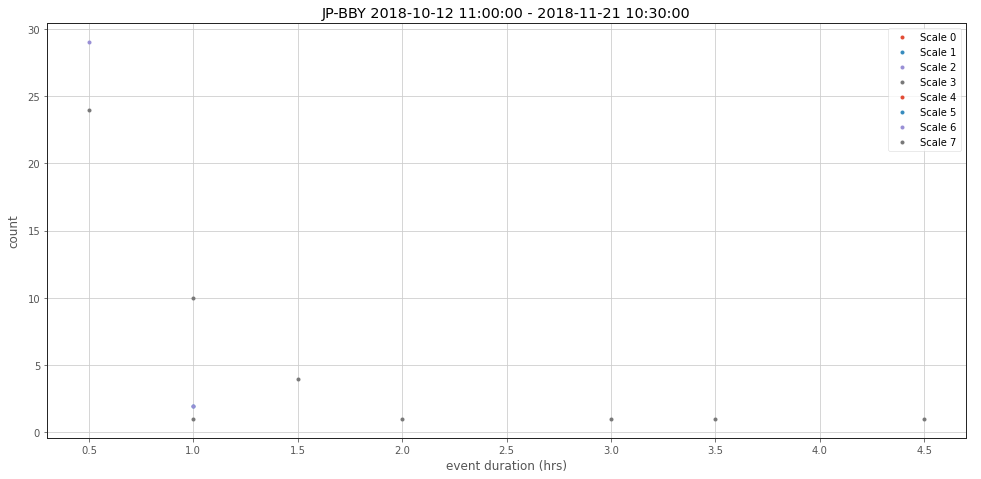

In [26]:
# event durations

fig, ax = plt.subplots(1, 1, figsize=(14,7), sharex=True, sharey=False)

bigax = fig.add_subplot(111, frameon=False)
bigax.grid(False)
bigax.tick_params(labelcolor='none', which='both', top=False, bottom=False,
              left=False, right=False)
bigax.set(xlabel='event duration (hrs)', ylabel='count', title=f'{site_id} {window[0]} - {window[-1]}')

colors = list(plt.rcParams['axes.prop_cycle'])

for j in range(len(cols)):
    df.loc[window, f'event_{j}'] = dfw[f'ebull_{j}'].diff().ne(0).cumsum()
    event_sizes = (df.loc[dfw.loc[mask[j]].index]
                   .groupby(f'event_{j}')
                   .size()
                   .apply(lambda x: x / 2.)
                  )
    ax.plot(event_sizes.value_counts(),
            '.', label = f'Scale {j}')
ax.legend()
# ax[-1].set(xlabel = 'date')

plt.tight_layout()

filename = f'plot/20210821/no_sum/20210821_FLX-BBY_{window[0].month}_event_durations.jpeg'
plt.savefig(filename)

plt.show()

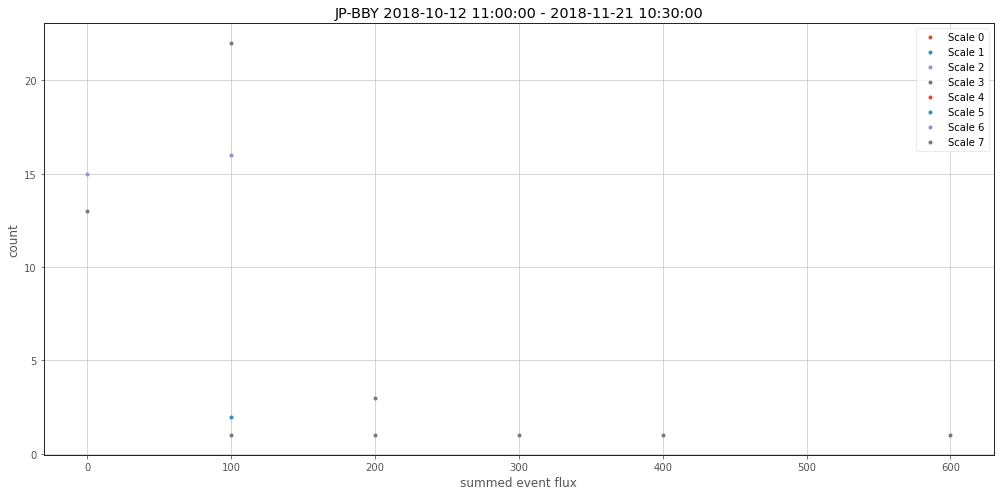

In [27]:

# event fluxes

fig, ax = plt.subplots(1, 1, figsize=(14,7), sharex=True, sharey=True)

# bigax = fig.add_subplot(111, frameon=False)
# bigax.grid(False)
# bigax.tick_params(labelcolor='none', which='both', top=False, bottom=False,
#               left=False, right=False)

ax.set(xlabel='summed event flux', ylabel='count', title=f'{site_id} {window[0]} - {window[-1]}')

colors = list(plt.rcParams['axes.prop_cycle'])

for j in range(len(cols)):
    events = dfw.loc[mask[j].index]
    df.loc[window, f'event_{j}'] = dfw[f'ebull_{j}'].diff().ne(0).cumsum()
    event_fluxes = (df.loc[dfw.loc[mask[j]].index]
                    .groupby(f'event_{j}')
                    .sum()
                    ['FCH4_F']
                    .round(-2)
                   )
    ax.plot(event_fluxes.value_counts(), '.',
           label = f'Scale {j}')
ax.legend()
# ax[-1].set(xlabel = 'date')

plt.tight_layout()

filename = f'plot/20210821/no_sum/20210821_FLX-BBY_{window[0].month}_event_fluxes.jpeg'
plt.savefig(filename)

plt.show()

## Haar wavelet
- break timeseries into windows of 8 samples (~4 hours)
- choose 'low ebullition' period with low RMSD for reference
- partition other windows using ref RMSD

In [2]:
site_id = 'JP-BBY'

df = wave.read('FLX_{}'.format(site_id), method='file')

df = df.replace(-9999, np.nan) # replace missing with nan
df['date'] = pd.to_datetime(df['TIMESTAMP_START'], format='%Y%m%d%H%M') # parse timestamp to new column 'date'
df = df.set_index(df['date'])

<AxesSubplot:title={'center':'2015 - 2018 JP-BBY'}, xlabel='date', ylabel='FCH4, gap-filled'>

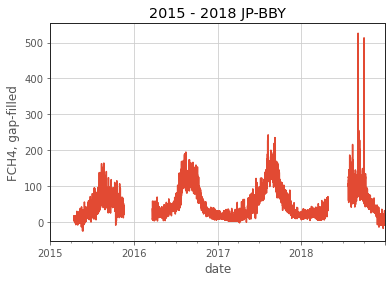

In [3]:
df['FCH4_F'].plot(ylabel = 'FCH4, gap-filled', 
                  title=f'{df.index[0].year} - {df.index[-1].year} {site_id}')

In [14]:
start = df['FCH4_F'].first_valid_index()

istart = df.index.get_loc(start)+1

df.iloc[istart:]['FCH4_F'].first_valid_index()

Timestamp('2015-04-14 12:00:00')

In [4]:
windows = wave.chop(df, samples = 8)

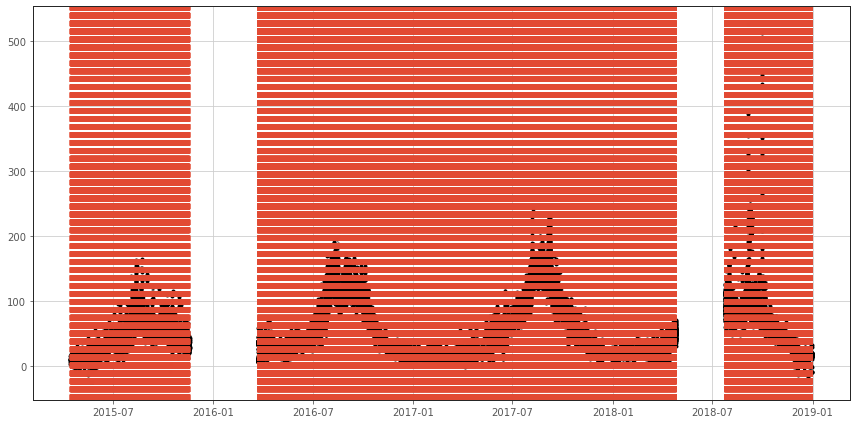

In [5]:
fig, ax = plt.subplots(figsize=(12,6))

ax.plot(df.index, df.loc[df.index, 'FCH4_F'], 'k.')
for w in windows:
    ax.axvline(w[0], ls='--')
    ax.axvline(w[-1], ls='--')

fig.tight_layout()

In [ ]:
# Scales separated

for window in windows:
    dfw = df.loc[window, :]
    dfp = wave.proc(dfw, level=3, wavelet='haar', sum_scales=False)
    
    # choose columns for partitioning
    Xcols = dfp.columns[dfp.columns.str.startswith('LE_w')]
    Ycols = dfp.columns[dfp.columns.str.startswith('FCH4_w')]
    
    plt.close('all')
    fig, ax = plt.subplots(len(Xcols) // 2, 2, figsize=(12,12), sharex=True, sharey=True)
    
    bigax = fig.add_subplot(111, frameon=False)
    bigax.grid(False)
    bigax.tick_params(labelcolor='none', which='both', top=False, bottom=False,
                  left=False, right=False)

    bigax.set(xlabel='LE wavelet coeff', ylabel='FCH4 wavelet coeff', 
              title='{} {} - {}'.format(site_id, window[0], window[-1]))
        
    for j in range(len(Xcols)):
        
        # calc regression
        pred, rmsd, r2 = wave.get_regr(dfp, Xcols[j], Ycols[j])
        
        df.loc[dfp.index, 'pred_{}'.format(j)] = pred
        df.loc[dfp.index, 'rmsd_{}'.format(j)] = np.ones(len(dfp)) * rmsd
        df.loc[dfp.index, 'r2_{}'.format(j)] = np.ones(len(dfp)) * r2
        
        ax[j // 2, j % 2].plot(dfp[Xcols[j]], dfp[Ycols[j]], 'k.',
                               dfp[Xcols[j]], pred, 'r-', 
                               dfp[Xcols[j]], pred + 3 * rmsd, 'r--', 
                               dfp[Xcols[j]], pred - 3 * rmsd, 'r--')
    
    plt.tight_layout()

    filename = 'plot/20210823/20210823_{}_shorthaar_iwata7_{}_{}_{}.jpeg'.format(site_id, window[0].year, window[0].month, window[0].day)
#     plt.savefig(filename)
    
    df.loc[window, Xcols] = dfp[Xcols]
    df.loc[window, Ycols] = dfp[Ycols]

    plt.close()

In [ ]:
# filename = f'plot/20210821/no_sum/20210821_{site_id}_short_rmsd_vs_date.jpeg'
filename = None
p.date_rmsd(df, title = f'{site_id} RMSD for ~4hr periods', 
            filename = filename,
            figsize=(14,6)
           )

<AxesSubplot:xlabel='date'>

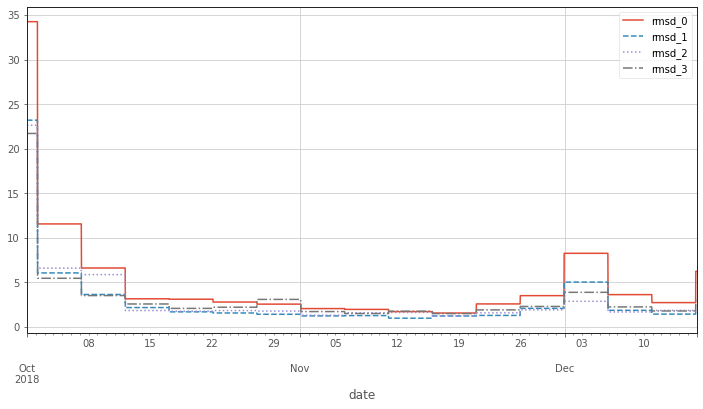

In [21]:
df.loc['2018-10':'2018-12-15', [f'rmsd_{j}' for j in range(len(Xcols))]].plot(figsize=(12,6))

In [14]:
df.loc[windows[-16]].index

DatetimeIndex(['2018-10-12 04:00:00', '2018-10-12 04:30:00',
               '2018-10-12 05:00:00', '2018-10-12 05:30:00',
               '2018-10-12 06:00:00', '2018-10-12 06:30:00',
               '2018-10-12 07:00:00', '2018-10-12 07:30:00',
               '2018-10-12 08:00:00', '2018-10-12 08:30:00',
               ...
               '2018-10-16 22:30:00', '2018-10-16 23:00:00',
               '2018-10-16 23:30:00', '2018-10-17 00:00:00',
               '2018-10-17 00:30:00', '2018-10-17 01:00:00',
               '2018-10-17 01:30:00', '2018-10-17 02:00:00',
               '2018-10-17 02:30:00', '2018-10-17 03:00:00'],
              dtype='datetime64[ns]', length=239, freq='30T')

In [35]:
[df.loc[window, [f'rmsd_{j}' for j in range(len(Xcols))]].mean() for window in windows[-16:-4]]

[rmsd_0    3.155465
 rmsd_1    2.175216
 rmsd_2    1.840840
 rmsd_3    2.576260
 dtype: float64,
 rmsd_0    3.110857
 rmsd_1    1.691849
 rmsd_2    1.766123
 rmsd_3    2.082217
 dtype: float64,
 rmsd_0    2.793865
 rmsd_1    1.565433
 rmsd_2    1.838372
 rmsd_3    2.212119
 dtype: float64,
 rmsd_0    2.559149
 rmsd_1    1.420607
 rmsd_2    1.777838
 rmsd_3    3.089520
 dtype: float64,
 rmsd_0    2.059179
 rmsd_1    1.234831
 rmsd_2    1.321620
 rmsd_3    1.723060
 dtype: float64,
 rmsd_0    1.968045
 rmsd_1    1.273406
 rmsd_2    1.586702
 rmsd_3    1.504505
 dtype: float64,
 rmsd_0    1.718351
 rmsd_1    0.982132
 rmsd_2    1.631242
 rmsd_3    1.766159
 dtype: float64,
 rmsd_0    1.559592
 rmsd_1    1.228091
 rmsd_2    1.242644
 rmsd_3    1.495187
 dtype: float64,
 rmsd_0    2.582546
 rmsd_1    1.291226
 rmsd_2    1.580543
 rmsd_3    1.911097
 dtype: float64,
 rmsd_0    3.511603
 rmsd_1    2.083843
 rmsd_2    1.916001
 rmsd_3    2.297961
 dtype: float64,
 rmsd_0    8.262646
 rmsd_1   

In [7]:
df = wave.partition(df, windows, rmsd=df.loc[windows[-2], 'rmsd_3'])

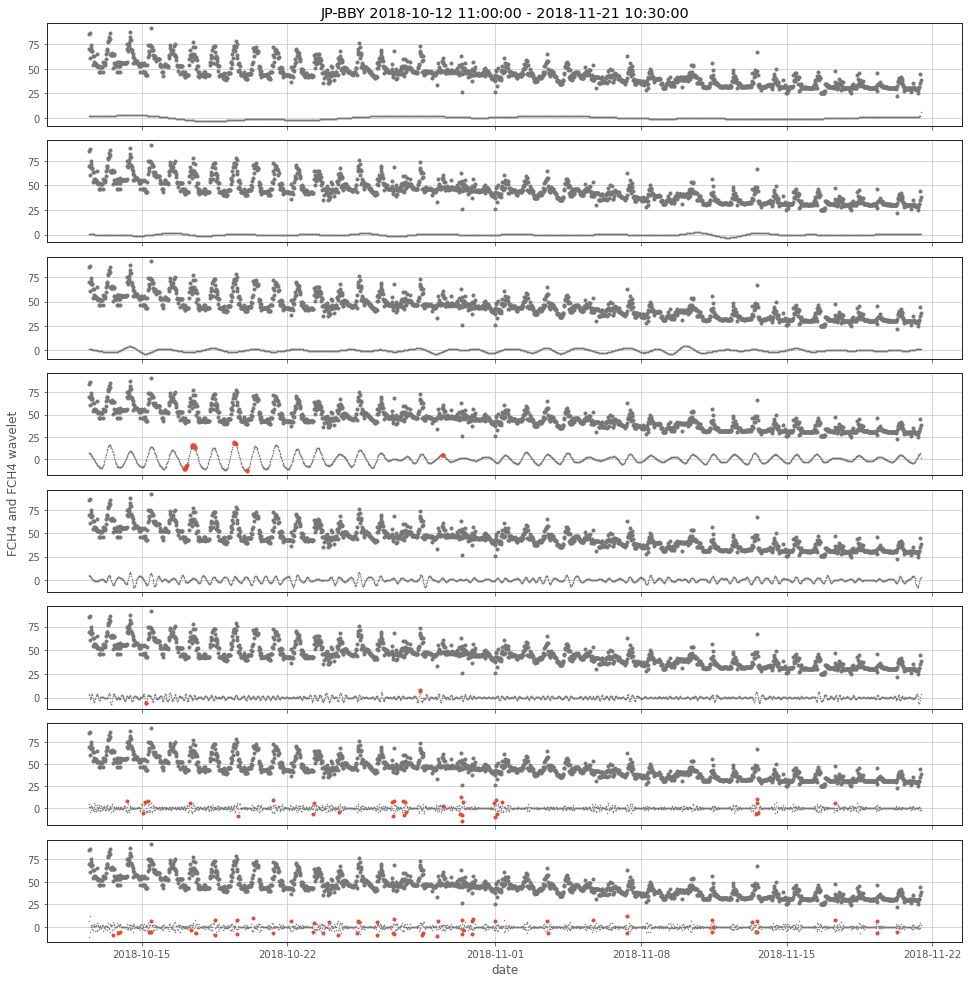

In [25]:
# Choose window and columns to plot
window = windows[-2]
dfw = df.loc[window]

cols = df.columns[df.columns.str.startswith('FCH4_w')]

# mask for ebullitive fluxes
mask = [dfw[f'ebull_{j}']==True for j in range(len(cols))]

plt.close('all')
fig, ax = plt.subplots(len(cols), 1, figsize=(14,14), sharex=True, sharey=False)

bigax = fig.add_subplot(111, frameon=False)
bigax.grid(False)
bigax.tick_params(labelcolor='none', which='both', top=False, bottom=False,
              left=False, right=False)
bigax.set(ylabel='FCH4 and FCH4 wavelet', title=f'{site_id} {window[0]} - {window[-1]}')

colors = list(plt.rcParams['axes.prop_cycle'])

for j in range(len(cols)):
    ax[j].plot(window, dfw[f'FCH4_F'], '.', color=colors[-1]['color'])
    ax[j].plot(window, dfw[f'FCH4_w{j}'], '.',color=colors[3]['color'], label='diffusive', markersize=1)
    ax[j].plot(dfw.loc[mask[j]].index, dfw.loc[dfw.loc[mask[j]].index, f'FCH4_w{j}'], '.', color = colors[0]['color'])
#     ax[j].plot(dfw.loc[dfw[f'ebull_{j}']==True].index, dfw.loc[dfw.loc[dfw[f'ebull_{j}']==True].index, f'FCH4_w{j}'], 'r.', label='ebullitive')

ax[-1].set(xlabel = 'date')

plt.tight_layout()

filename = f'plot/20210821/no_sum/20210821_FLX-BBY_{window[0].month}_partition_vs_FCH4.jpeg'
plt.savefig(filename)

plt.show()

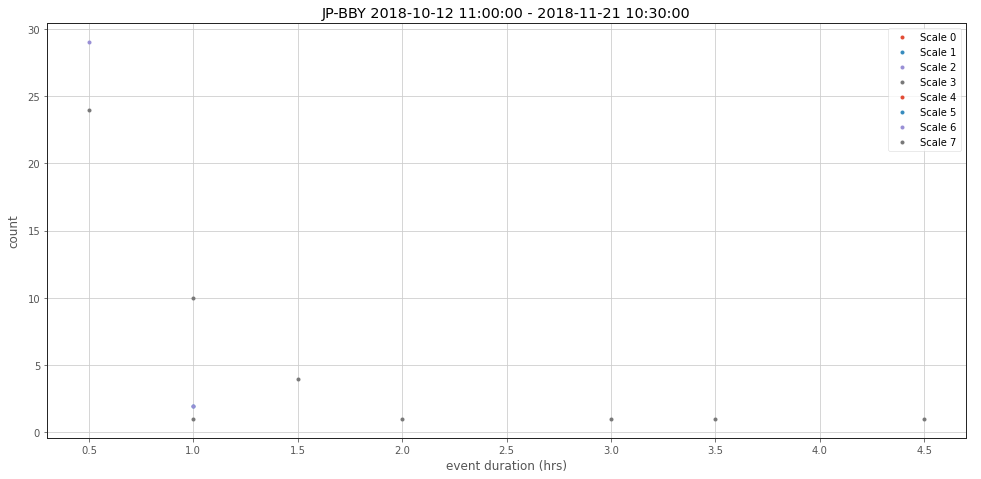

In [26]:
# event durations

fig, ax = plt.subplots(1, 1, figsize=(14,7), sharex=True, sharey=False)

bigax = fig.add_subplot(111, frameon=False)
bigax.grid(False)
bigax.tick_params(labelcolor='none', which='both', top=False, bottom=False,
              left=False, right=False)
bigax.set(xlabel='event duration (hrs)', ylabel='count', title=f'{site_id} {window[0]} - {window[-1]}')

colors = list(plt.rcParams['axes.prop_cycle'])

for j in range(len(cols)):
    df.loc[window, f'event_{j}'] = dfw[f'ebull_{j}'].diff().ne(0).cumsum()
    event_sizes = (df.loc[dfw.loc[mask[j]].index]
                   .groupby(f'event_{j}')
                   .size()
                   .apply(lambda x: x / 2.)
                  )
    ax.plot(event_sizes.value_counts(),
            '.', label = f'Scale {j}')
ax.legend()
# ax[-1].set(xlabel = 'date')

plt.tight_layout()

filename = f'plot/20210821/no_sum/20210821_FLX-BBY_{window[0].month}_event_durations.jpeg'
plt.savefig(filename)

plt.show()

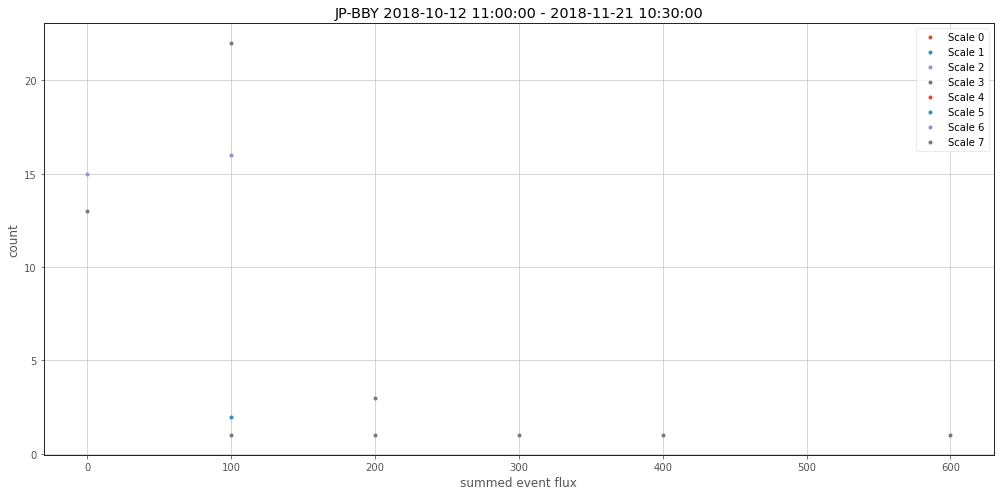

In [27]:

# event fluxes

fig, ax = plt.subplots(1, 1, figsize=(14,7), sharex=True, sharey=True)

# bigax = fig.add_subplot(111, frameon=False)
# bigax.grid(False)
# bigax.tick_params(labelcolor='none', which='both', top=False, bottom=False,
#               left=False, right=False)

ax.set(xlabel='summed event flux', ylabel='count', title=f'{site_id} {window[0]} - {window[-1]}')

colors = list(plt.rcParams['axes.prop_cycle'])

for j in range(len(cols)):
    events = dfw.loc[mask[j].index]
    df.loc[window, f'event_{j}'] = dfw[f'ebull_{j}'].diff().ne(0).cumsum()
    event_fluxes = (df.loc[dfw.loc[mask[j]].index]
                    .groupby(f'event_{j}')
                    .sum()
                    ['FCH4_F']
                    .round(-2)
                   )
    ax.plot(event_fluxes.value_counts(), '.',
           label = f'Scale {j}')
ax.legend()
# ax[-1].set(xlabel = 'date')

plt.tight_layout()

filename = f'plot/20210821/no_sum/20210821_FLX-BBY_{window[0].month}_event_fluxes.jpeg'
plt.savefig(filename)

plt.show()

### Summary stats for full timeseries

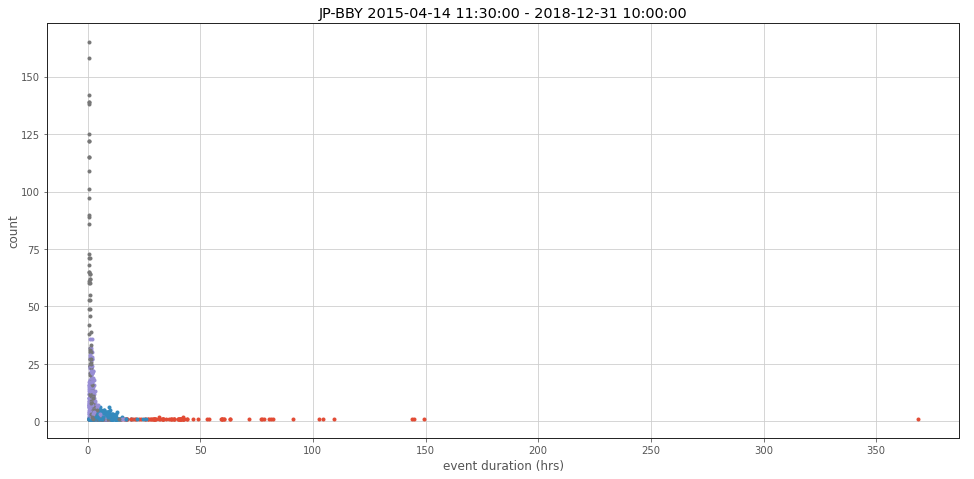

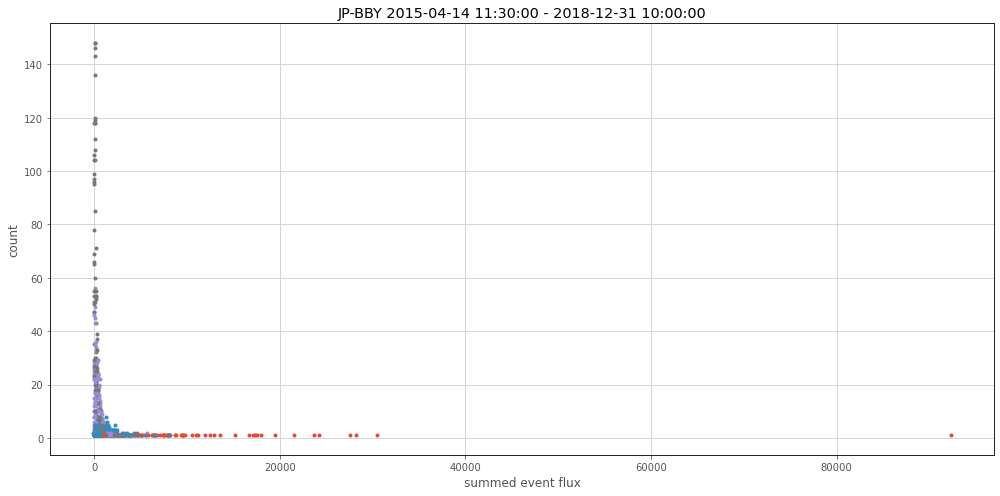

In [30]:
# event durations

fig, ax = plt.subplots(1, 1, figsize=(14,7), sharex=True, sharey=False)

bigax = fig.add_subplot(111, frameon=False)
bigax.grid(False)
bigax.tick_params(labelcolor='none', which='both', top=False, bottom=False,
              left=False, right=False)
bigax.set(xlabel='event duration (hrs)', ylabel='count', title=f'{site_id} {windows[0][0]} - {windows[-1][-1]}')

colors = list(plt.rcParams['axes.prop_cycle'])

for window in windows:
    dfw = df.loc[window]
    cols = df.columns[df.columns.str.startswith('FCH4_w')]

    # mask for ebullitive fluxes
    mask = [dfw[f'ebull_{j}']==True for j in range(len(cols))]

    for j in range(0, len(cols)):
        df.loc[window, f'event_{j}'] = dfw[f'ebull_{j}'].diff().ne(0).cumsum()
        event_sizes = (df.loc[dfw.loc[mask[j]].index]
                       .groupby(f'event_{j}')
                       .size()
                       .apply(lambda x: x / 2.)
                      )
        ax.plot(event_sizes.value_counts(),
                '.', label = f'Scale {j}')
# ax.legend()
# ax[-1].set(xlabel = 'date')

plt.tight_layout()

filename = 'plot/20210727/20210727_FLX-BBY_07_partition_vs_FCH4.jpeg'
# plt.savefig(filename)

plt.show()


# event fluxes

fig, ax = plt.subplots(1, 1, figsize=(14,7), sharex=True, sharey=True)

# bigax = fig.add_subplot(111, frameon=False)
# bigax.grid(False)
# bigax.tick_params(labelcolor='none', which='both', top=False, bottom=False,
#               left=False, right=False)

ax.set(xlabel='summed event flux', ylabel='count', title=f'{site_id} {windows[0][0]} - {windows[-1][-1]}')

colors = list(plt.rcParams['axes.prop_cycle'])

for window in windows:
    dfw = df.loc[window]
    cols = df.columns[df.columns.str.startswith('FCH4_w')]

    # mask for ebullitive fluxes
    mask = [dfw[f'ebull_{j}']==True for j in range(len(cols))]

    for j in range(0, len(cols)):
        events = dfw.loc[mask[j].index]
        df.loc[window, f'event_{j}'] = dfw[f'ebull_{j}'].diff().ne(0).cumsum()
        event_fluxes = (df.loc[dfw.loc[mask[j]].index]
                        .groupby(f'event_{j}')
                        .sum()
                        ['FCH4_F']
                        .round(-2)
                       )
        ax.plot(event_fluxes.value_counts(), '.',
               label = f'Scale {j}')
# ax.legend()
# ax[-1].set(xlabel = 'date')

plt.tight_layout()

filename = 'plot/20210727/20210727_FLX-BBY_07_partition_vs_FCH4.jpeg'
# plt.savefig(filename)

plt.show()

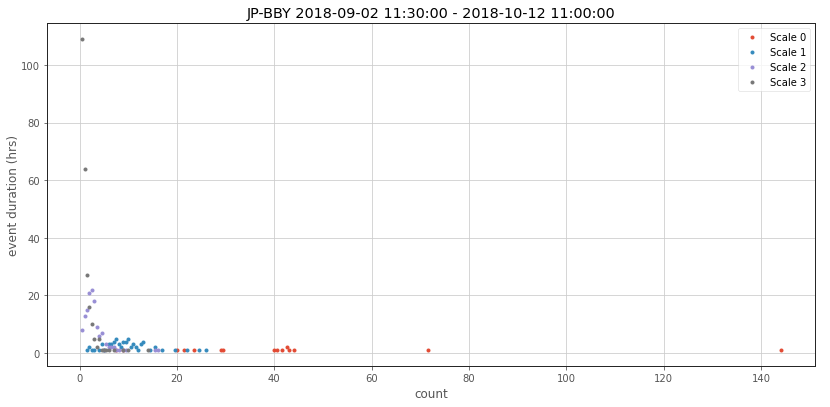

In [133]:
# Choose window and columns to plot
window = windows[-3]
dfw = df.loc[window]

cols = df.columns[df.columns.str.startswith('FCH4_w')]

# mask for ebullitive fluxes
mask = [dfw[f'ebull_{j}']==True for j in range(len(cols))]


plt.close('all')
fig, ax = plt.subplots(1, 1, figsize=(12,6), sharex=True, sharey=False)

bigax = fig.add_subplot(111, frameon=False)
bigax.grid(False)
bigax.tick_params(labelcolor='none', which='both', top=False, bottom=False,
              left=False, right=False)
bigax.set(ylabel='event duration (hrs)', xlabel='count', title=f'{site_id} {window[0]} - {window[-1]}')

colors = list(plt.rcParams['axes.prop_cycle'])

for j in range(len(cols)):
    df.loc[window, f'event_{j}'] = dfw[f'ebull_{j}'].diff().ne(0).cumsum()
    ax.plot((df.loc[dfw.loc[mask[j]].index].groupby(f'event_{j}').size() / 2.).value_counts(), '.',
           label = f'Scale {j}')
ax.legend()
# ax[-1].set(xlabel = 'date')

plt.tight_layout()

filename = 'plot/20210727/20210727_FLX-BBY_07_partition_vs_FCH4.jpeg'
# plt.savefig(filename)

plt.show()

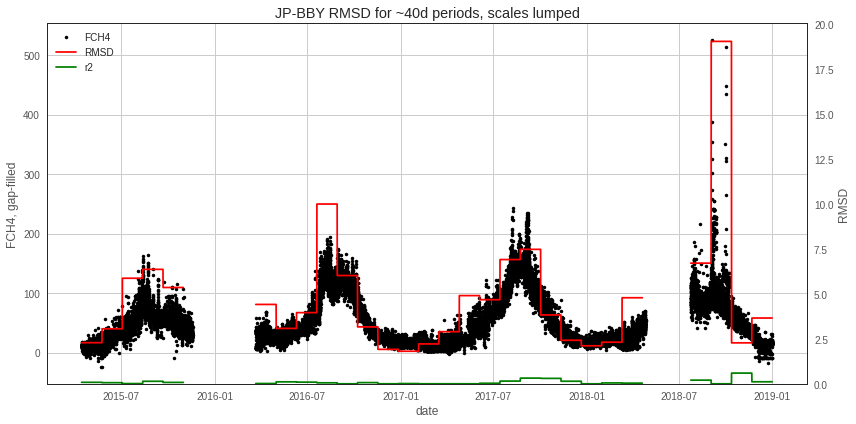

In [92]:
p.date_rmsd_lump(df, title = '{} RMSD for ~40d periods, scales lumped'.format(site_id),
                 filename='plot/20210716/20210716_{}_lump_rmsd_vs_date.jpeg'.format(site_id))

## 6 month intervals

In [3]:
# df = wave.pd_read_from_drive('FLX_JP-BBY') # read from google drive into pd.DataFrame
# df = wave.read('FLX_JP-BBY', method='url')
df = wave.read('FLX_JP-BBY', method='file')

In [4]:
df = df.replace(-9999, np.nan) # replace missing with nan
df['date'] = pd.to_datetime(df['TIMESTAMP_START'], format='%Y%m%d%H%M') # parse timestamp to new column 'date'
df = df.set_index(df['date'])

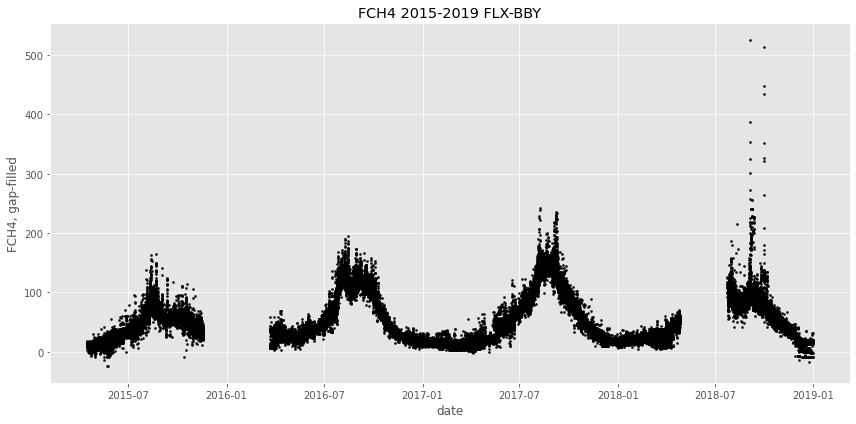

In [5]:
p.date(df.index, df['FCH4_F'], xlabel='date', ylabel='FCH4, gap-filled', title="FCH4 2015-2019 FLX-BBY")

In [6]:
date_ranges = [pd.date_range(start, stop, freq='30min') for [start, stop] in [['2015-01', '2015-07'], 
                                                                        ['2015-07', '2016-01'], 
                                                                        ['2016-01', '2016-07'], 
                                                                        ['2016-07', '2017-01'], 
                                                                        ['2017-01', '2017-07'], 
                                                                        ['2017-07', '2018-01'], 
                                                                        ['2018-01', '2018-07'], 
                                                                        ['2018-07', '2018-12-30']]]

In [7]:
idates = [df.loc[date_range, 'FCH4_F'].notna().index for date_range in date_ranges] #convert date ranges to indices, ignoring missing data

In [8]:
for idate in idates:
    dfw = df.loc[idate, :]
    dfw = dfw.loc[dfw['FCH4'].first_valid_index():dfw['FCH4'].last_valid_index()]
    
#     dfp = wave.wave(dfw) # process to new df
    dfp = wave.proc(dfw)
    
    # choose columns for partitioning
    Xcols = dfp.columns[dfp.columns.str.startswith('LE_w')]
    Ycols = dfp.columns[dfp.columns.str.startswith('FCH4_w')]
    
    # calc regression
    pred, [Xflat, Yflat], rmsd, r2 = wave.get_regr(dfp, Xcols, Ycols)
    
    # partition
    dfp = wave.part(dfp, pred, rmsd, r2)
    
#     p.iwata7(Xflat, Yflat, pred, rmsd, xlabel='LE wavelet coeff', ylabel='FCH4 wavelet coeff', 
#            title='{} - {}'.format(idate[0], idate[-1]), 
#              filename = 'plot/20210714_iwata7_{}_{}.jpeg'.format(idate[0].year, idate[0].month))
    
    df.loc[dfw.index, 'rmsd'] = dfp.loc[:, 'rmsd'] # write back to df
    df.loc[dfw.index, 'r2'] = dfp.loc[:, 'r2'] # write back to df


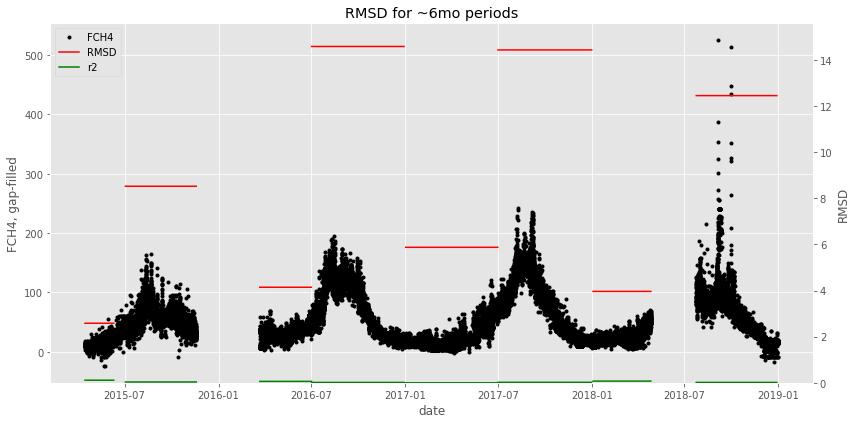

In [9]:
fig, ax = plt.subplots(figsize = (12,6))

ax.plot(df.index, df.loc[:, 'FCH4_F'], 'k.', label='FCH4')
ax.set(xlabel = 'date', ylabel = 'FCH4, gap-filled', title = 'RMSD for ~6mo periods')

axr = ax.twinx()
axr.grid(False)
axr.yaxis.set_label_position('right')
axr.yaxis.tick_right()
axr.plot(df.index, df.loc[:, 'rmsd'], 'r-', label='RMSD')
axr.plot(df.index, df.loc[:, 'r2'], 'g-', label='r2')
axr.set_ylim([0, df.loc[:, 'rmsd'].max() + 1])
axr.set_ylabel('RMSD')

# ask matplotlib for the plotted objects and their labels
lines, labels = ax.get_legend_handles_labels()
linesr, labelsr = axr.get_legend_handles_labels()
ax.legend(lines + linesr, labels + labelsr, loc=2)

plt.tight_layout()
# plt.savefig('plot/20210709_rmsd_vs_date.jpeg')

## 2 month intervals

In [3]:
# df = wave.pd_read_from_drive('FLX_JP-BBY') # read from google drive into pd.DataFrame
# df = wave.read('FLX_JP-BBY', method='url')

In [3]:
site_id = 'JP-BBY'

In [4]:
df = wave.read('FLX_{}'.format(site_id), method='file')

In [5]:
df = df.replace(-9999, np.nan) # replace missing with nan
df['date'] = pd.to_datetime(df['TIMESTAMP_START'], format='%Y%m%d%H%M') # parse timestamp to new column 'date'
df = df.set_index(df['date'])

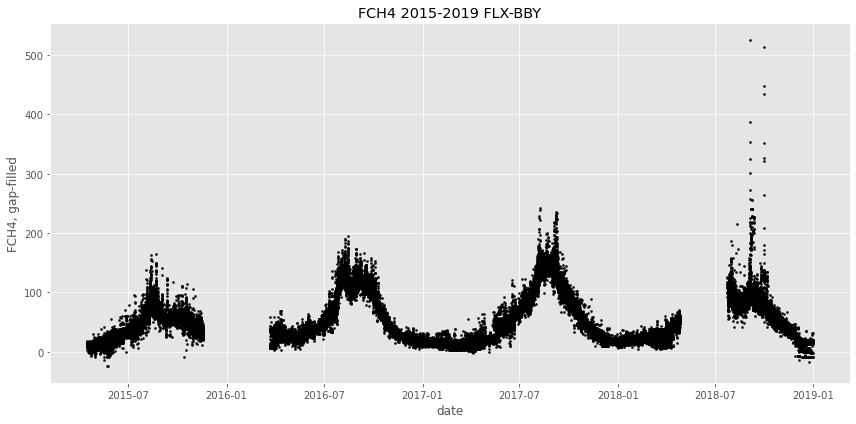

In [6]:
p.date(df.index, df['FCH4_F'], xlabel='date', ylabel='FCH4, gap-filled', title="FCH4 2015-2019 FLX-BBY")

In [7]:
windows = wave.chop(df)

appending window 2015-04-14 11:30:00 to 2015-05-24 11:00:00 to windows
appending window 2015-05-24 11:00:00 to 2015-07-03 10:30:00 to windows
appending window 2015-07-03 10:30:00 to 2015-08-12 10:00:00 to windows
appending window 2015-08-12 10:00:00 to 2015-09-21 09:30:00 to windows
appending window 2015-09-21 09:30:00 to 2015-10-31 09:00:00 to windows
window 2015-10-31 09:00:00 to 2015-12-10 08:30:00 contains missing data
appending window 2016-03-21 17:00:00 to 2016-04-30 16:30:00 to windows
appending window 2016-04-30 16:30:00 to 2016-06-09 16:00:00 to windows
appending window 2016-06-09 16:00:00 to 2016-07-19 15:30:00 to windows
appending window 2016-07-19 15:30:00 to 2016-08-28 15:00:00 to windows
appending window 2016-08-28 15:00:00 to 2016-10-07 14:30:00 to windows
appending window 2016-10-07 14:30:00 to 2016-11-16 14:00:00 to windows
appending window 2016-11-16 14:00:00 to 2016-12-26 13:30:00 to windows
appending window 2016-12-26 13:30:00 to 2017-02-04 13:00:00 to windows
appen

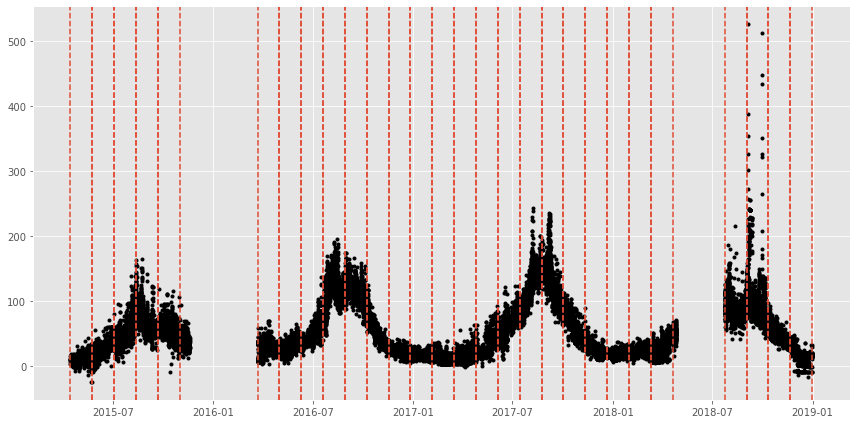

In [8]:
fig, ax = plt.subplots(figsize=(12,6))

ax.plot(df.index, df.loc[df.index, 'FCH4_F'], 'k.')
for w in windows:
    ax.axvline(w[0], ls='--')
    ax.axvline(w[-1], ls='--')

fig.tight_layout()

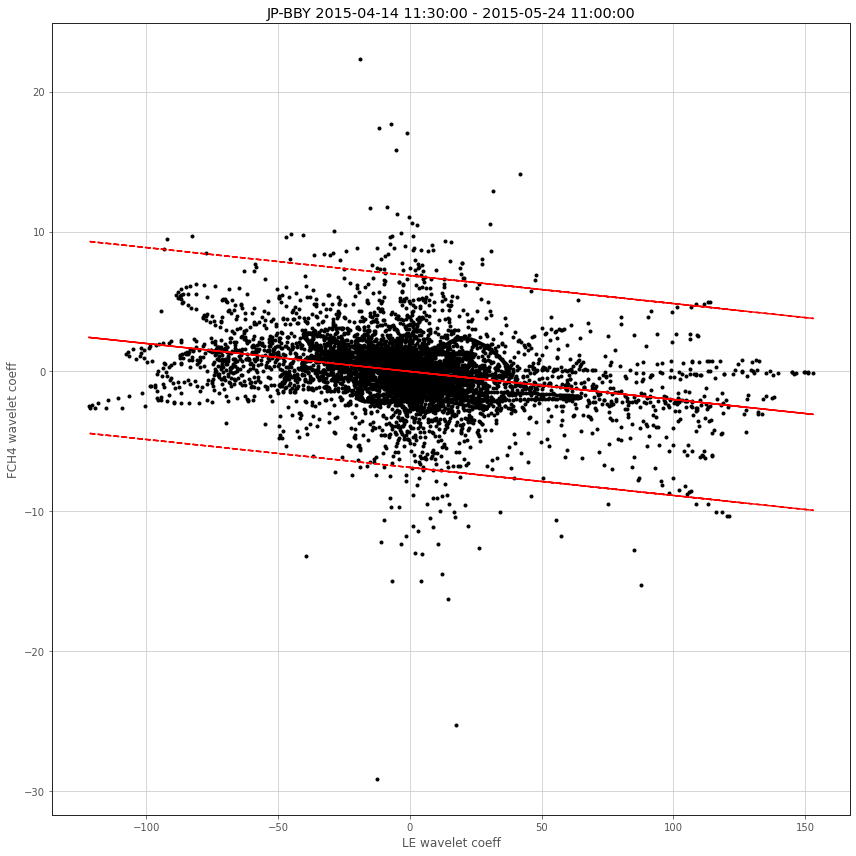

In [ ]:
# Scales lumped

for window in windows:
    dfw = df.loc[window, :]
    dfp = wave.proc(dfw)
    
    # choose columns for partitioning
    Xcols = dfp.columns[dfp.columns.str.startswith('LE_w')]
    Ycols = dfp.columns[dfp.columns.str.startswith('FCH4_w')]

    # calc regression
    pred, rmsd, r2 = wave.get_regr_lump(dfp, Xcols, Ycols)
    
    # partition
    dfp = wave.part(dfp, pred, rmsd, r2)
    
    # lump columns to flattened arrays
    Xflat = np.concatenate(dfp[Xcols].to_numpy()).reshape(-1, 1)
    Yflat = np.concatenate(dfp[Ycols].to_numpy()).reshape(-1, 1)
        
    filename = None
#     filename = 'plot/20210716/20210716_{}_lump_iwata7_{}_{}.jpeg'.format(site_id, window[0].year, window[0].month)
    
    p.iwata7(Xflat, Yflat, pred, rmsd, xlabel='LE wavelet coeff', ylabel='FCH4 wavelet coeff', 
           title='{} {} - {}'.format(site_id, window[0], window[-1]), 
             filename = filename)
    
    df.loc[dfw.index, 'rmsd'] = dfp.loc[:, 'rmsd'] # write back to df
    df.loc[dfw.index, 'r2'] = dfp.loc[:, 'r2'] # write back to df

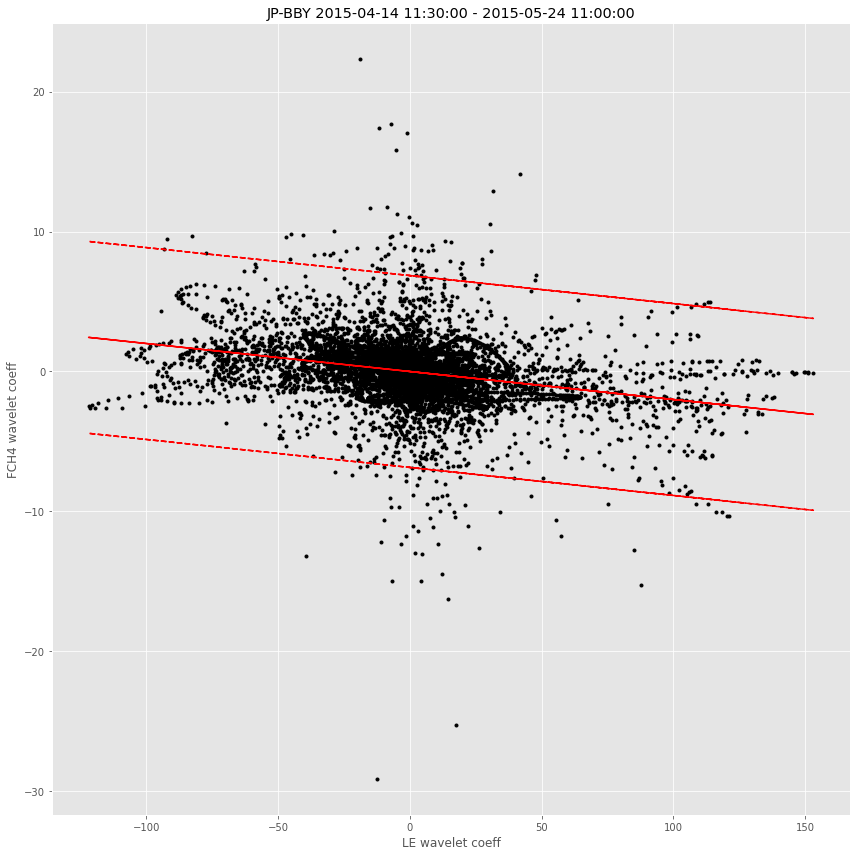

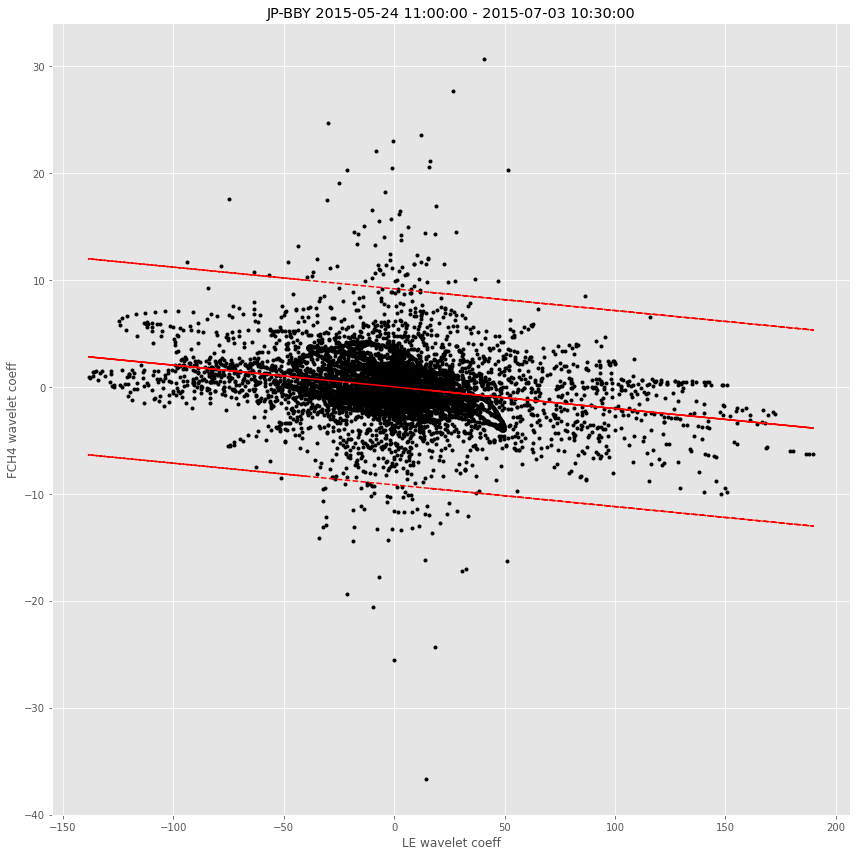

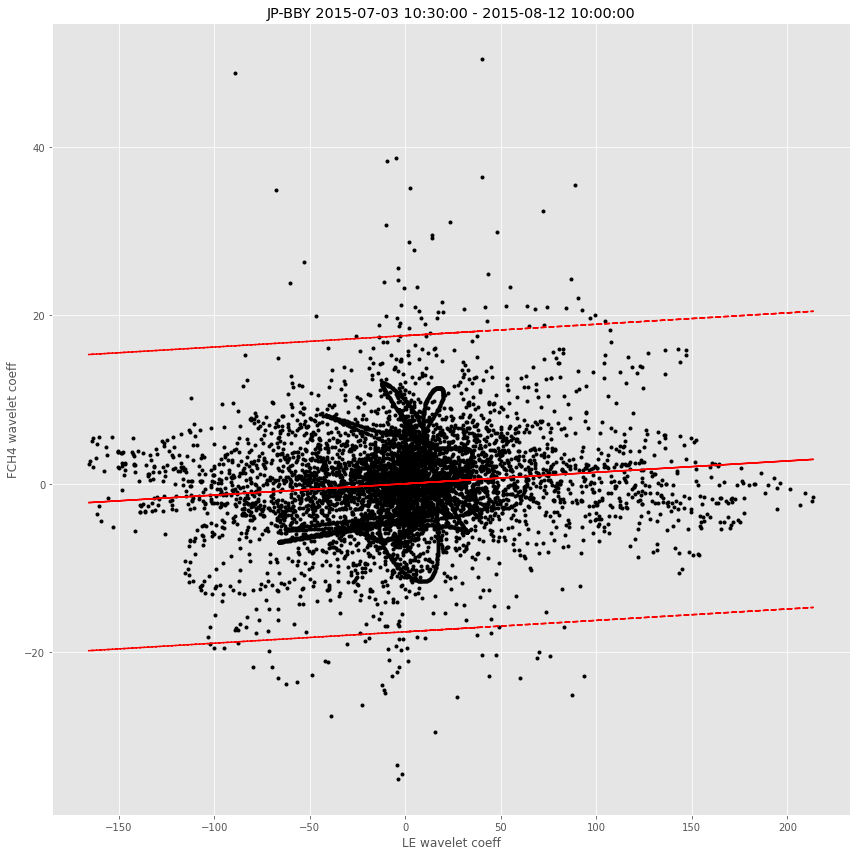

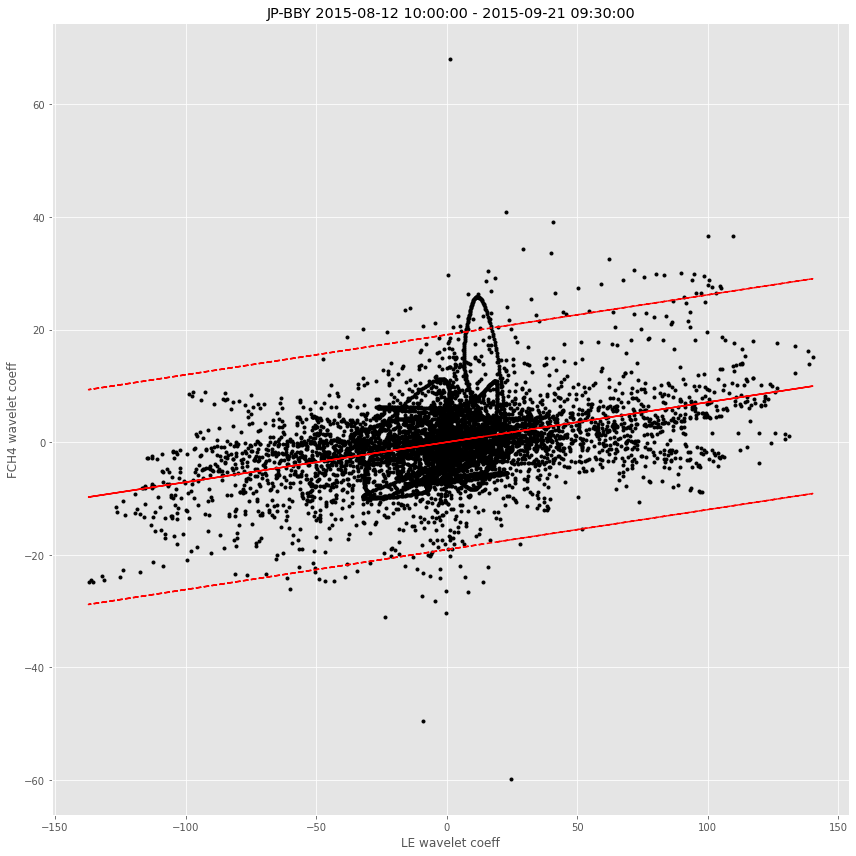

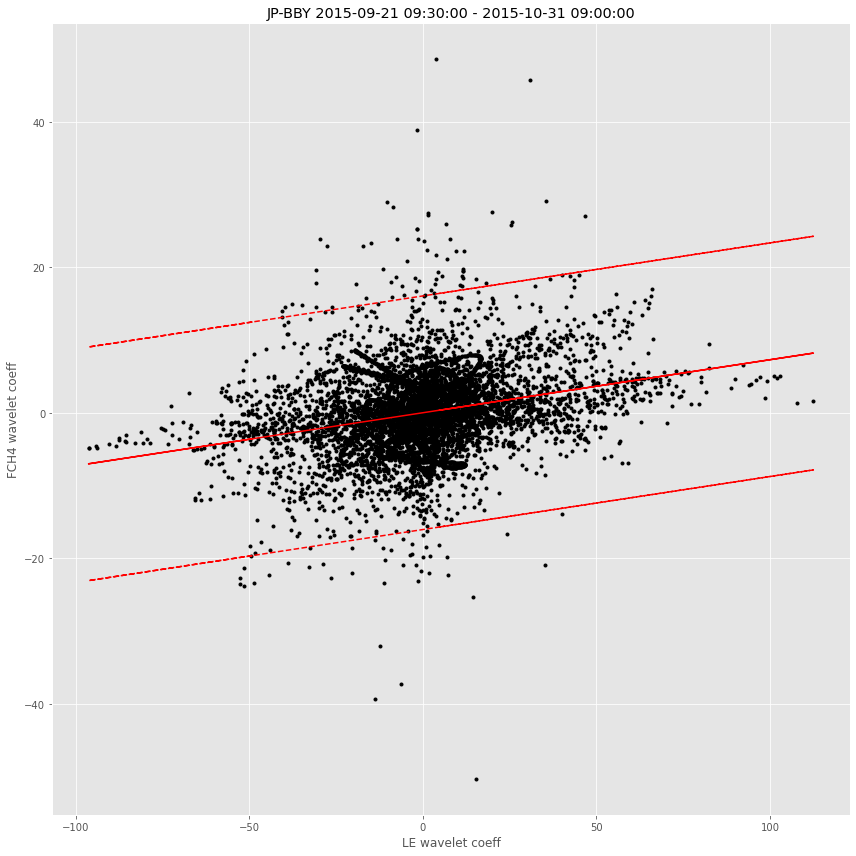

...

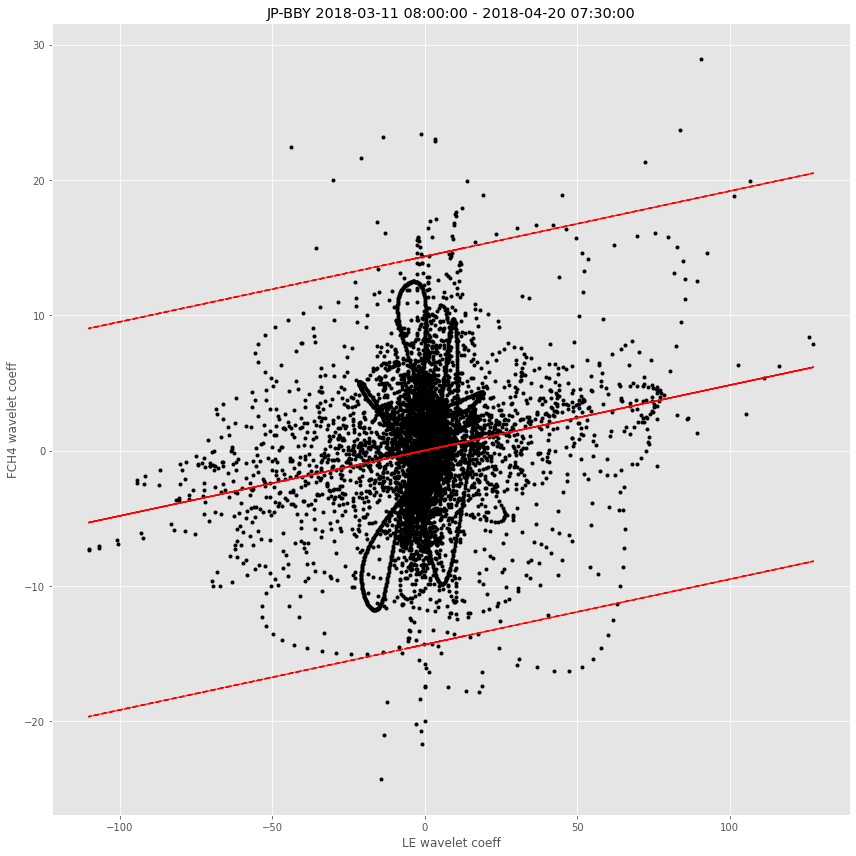

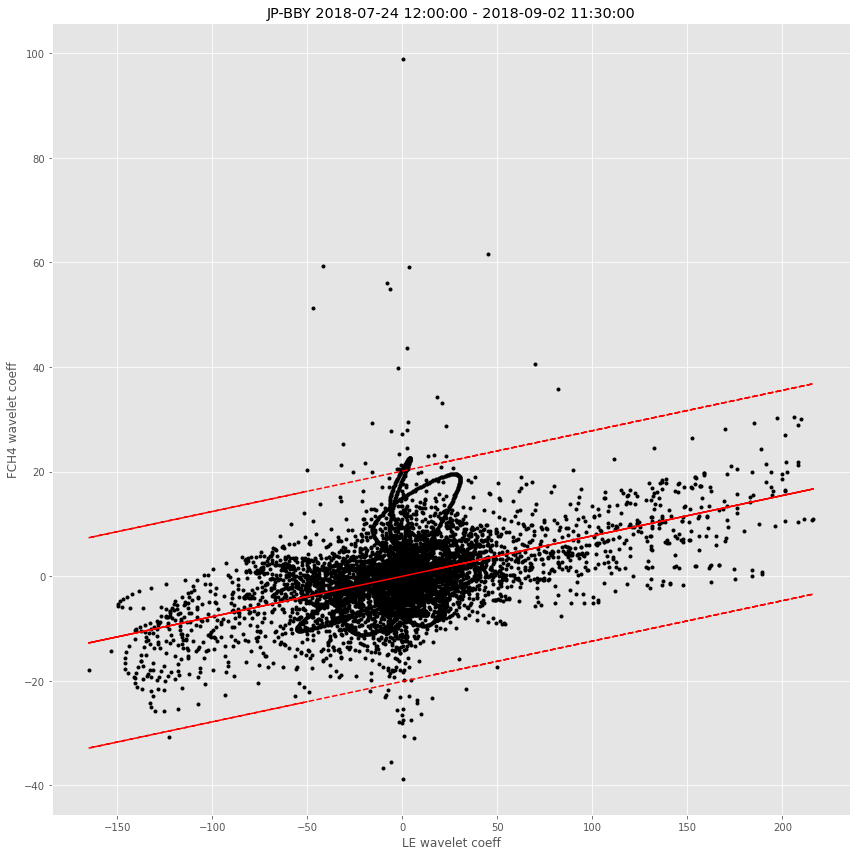

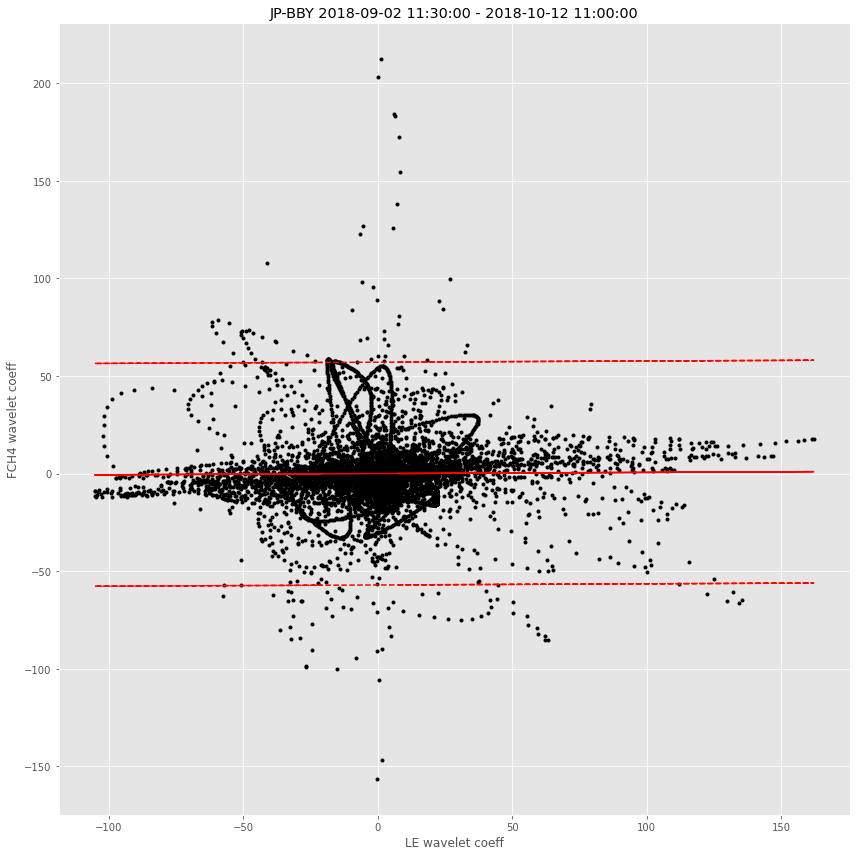

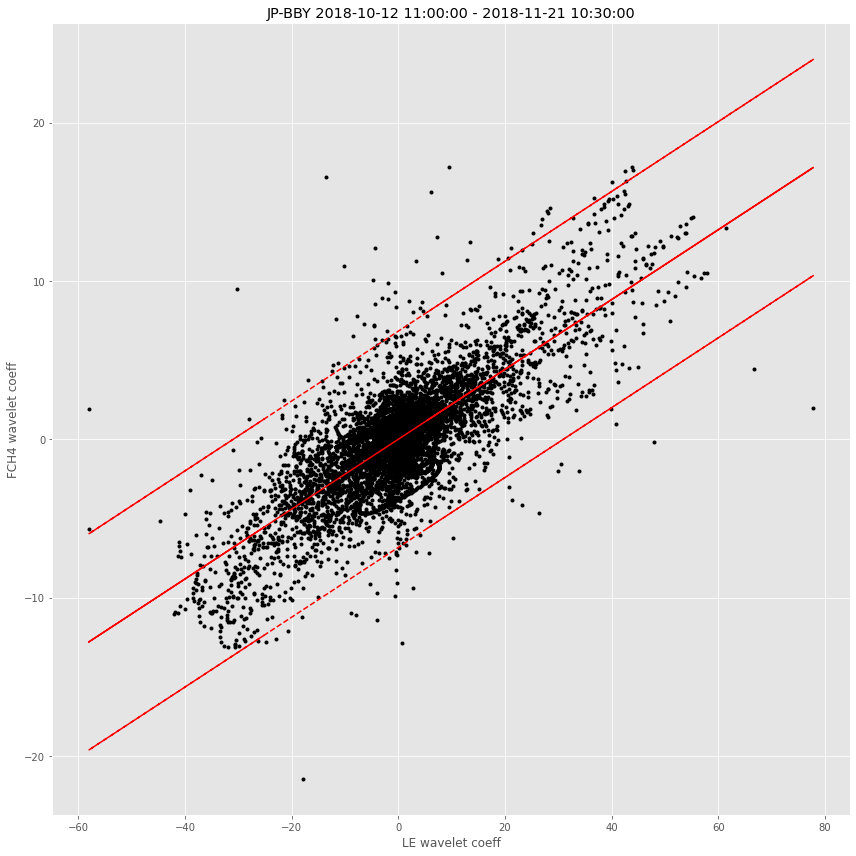

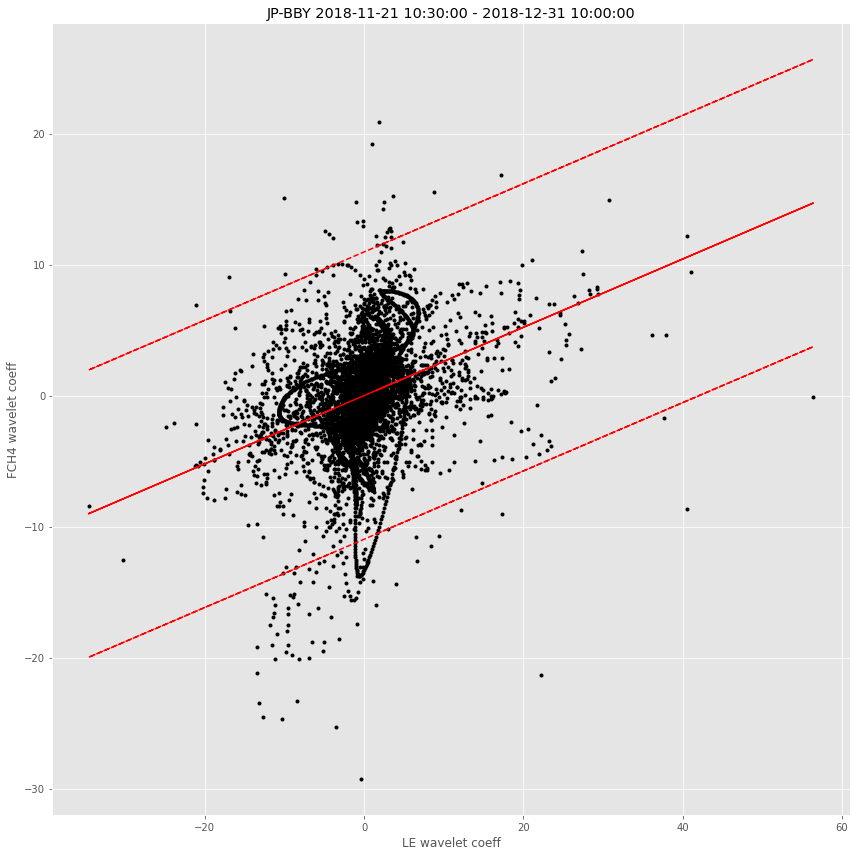

In [10]:
# Scales lumped

for window in windows:
    dfw = df.loc[window, :]
    dfp = wave.proc(dfw)
    
    # choose columns for partitioning
    Xcols = dfp.columns[dfp.columns.str.startswith('LE_w')]
    Ycols = dfp.columns[dfp.columns.str.startswith('FCH4_w')]
    
    # calc regression
    pred, [Xflat, Yflat], rmsd, r2 = wave.get_regr(dfp, Xcols, Ycols)
    
    Xflat = np.concatenate(dfp[Xcols].to_numpy()).reshape(-1, 1)
    Yflat = np.concatenate(dfp[Ycols].to_numpy()).reshape(-1, 1)

    
    # partition
    dfp = wave.part(dfp, pred, rmsd, r2)
    
#     filename = None
    filename = 'plot/20210716/20210716_{}_lump_iwata7_{}_{}.jpeg'.format(site_id, window[0].year, window[0].month)
    
    p.iwata7(Xflat, Yflat, pred, rmsd, xlabel='LE wavelet coeff', ylabel='FCH4 wavelet coeff', 
           title='{} {} - {}'.format(site_id, window[0], window[-1]), 
             filename = filename)
    
    df.loc[dfw.index, 'rmsd'] = dfp.loc[:, 'rmsd'] # write back to df
    df.loc[dfw.index, 'r2'] = dfp.loc[:, 'r2'] # write back to df

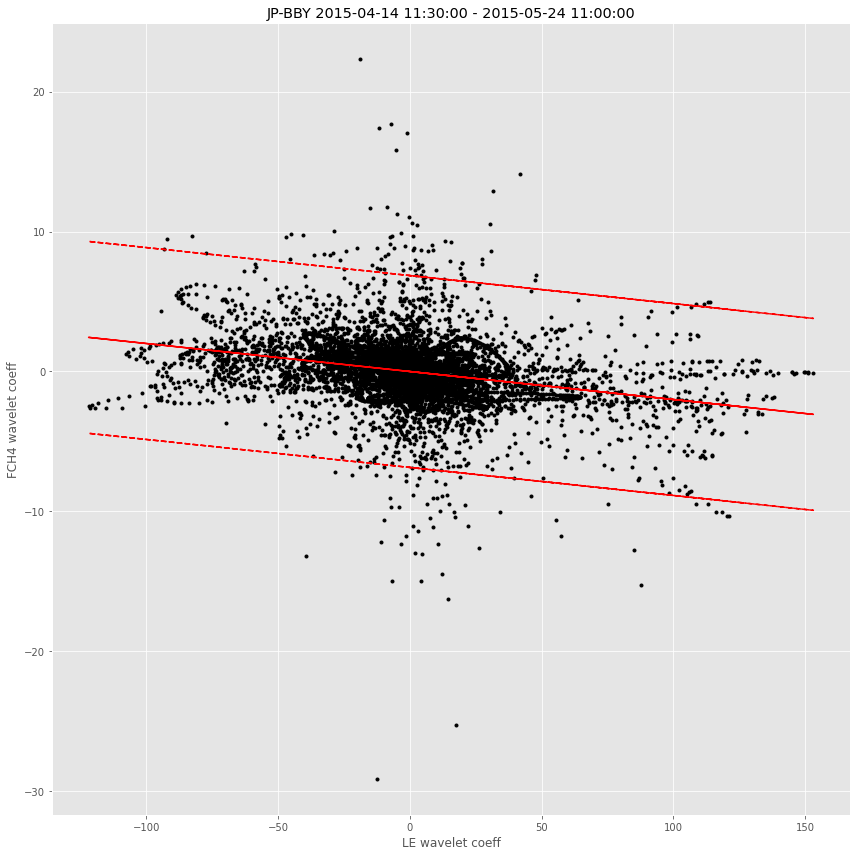

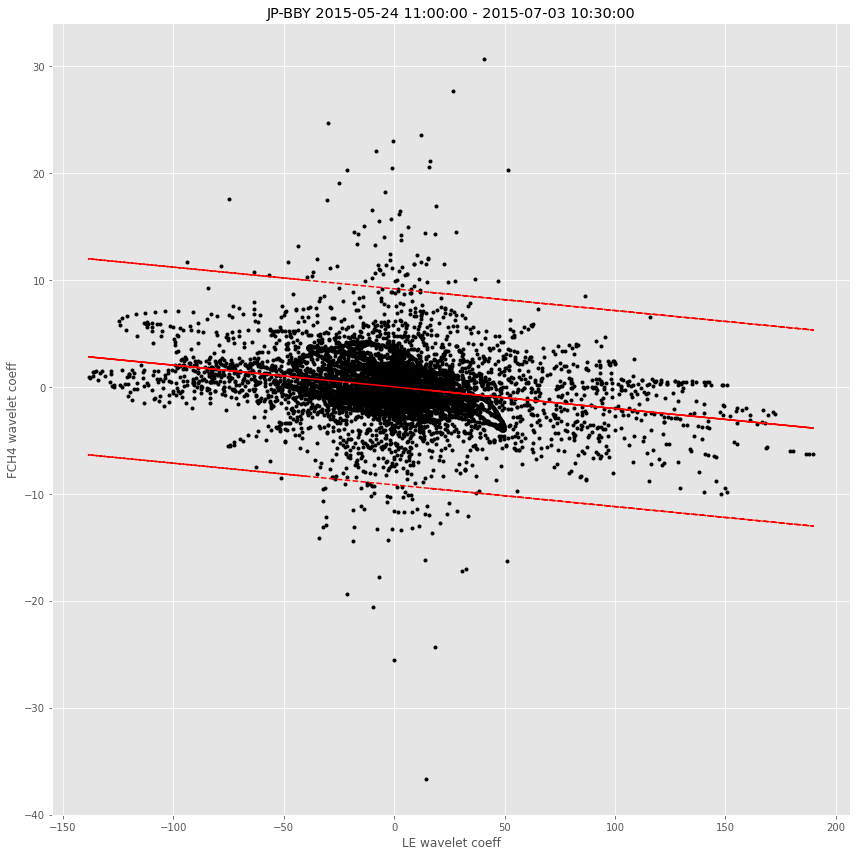

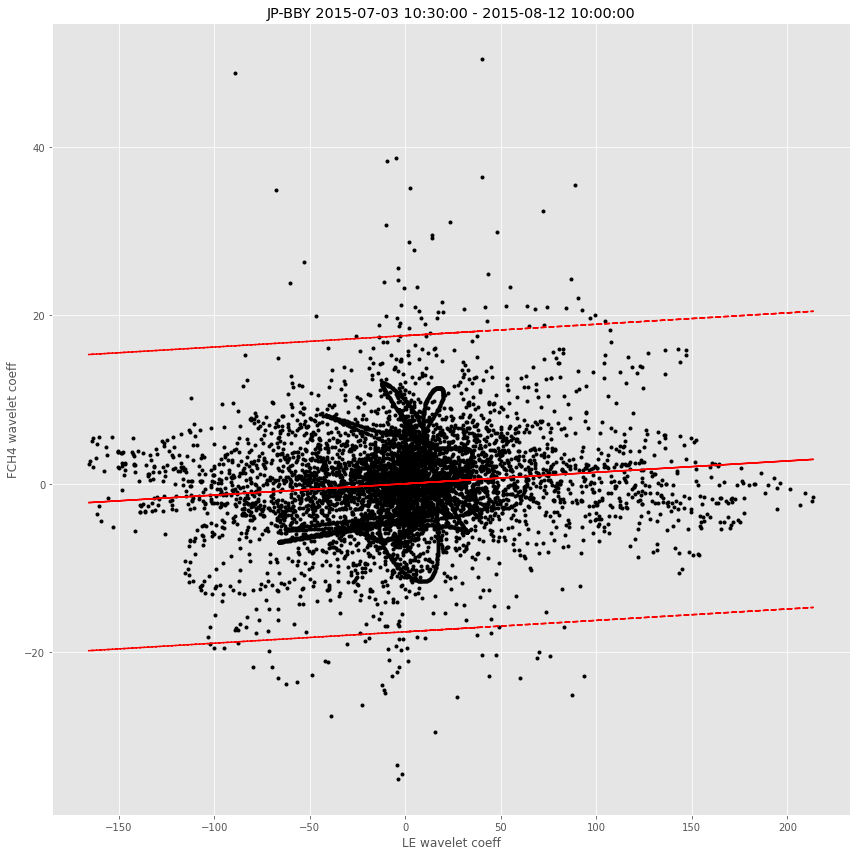

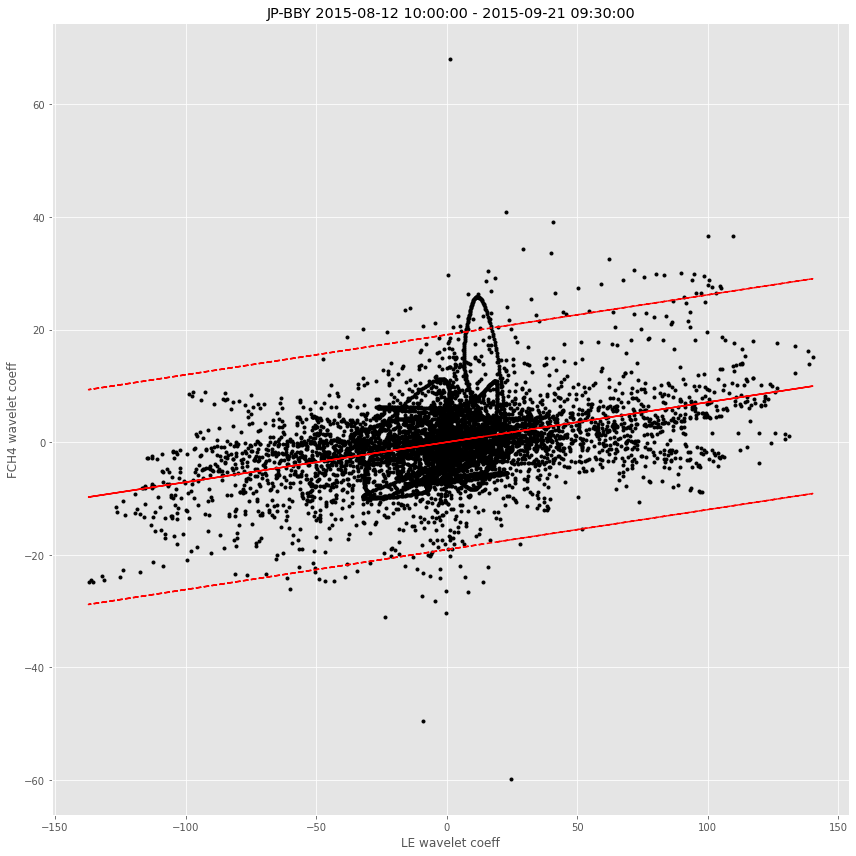

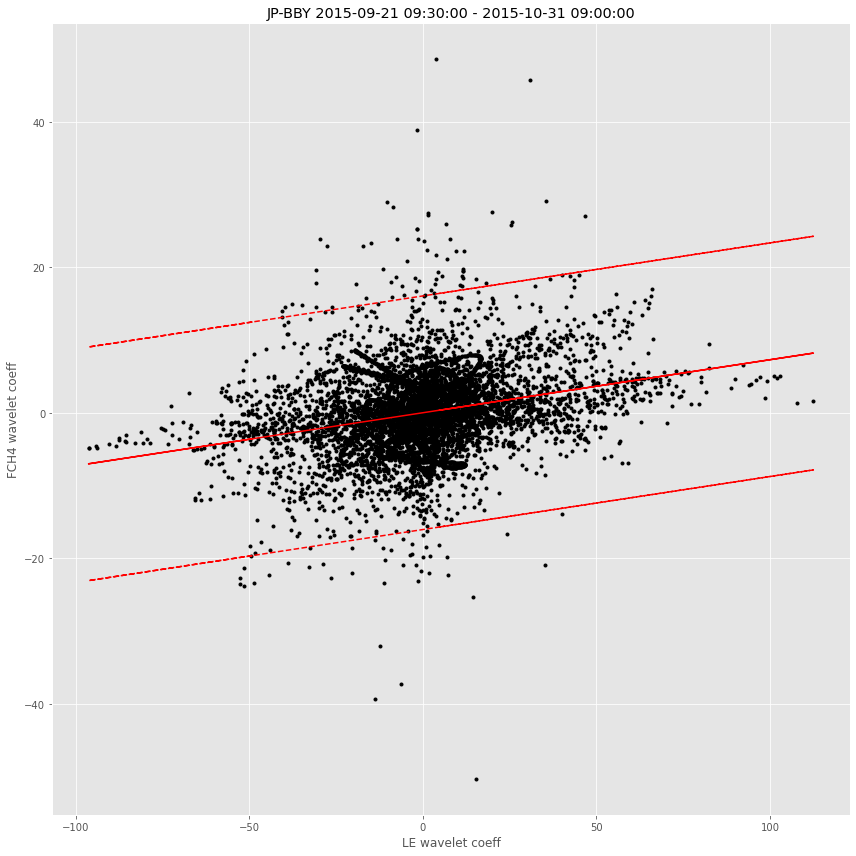

...

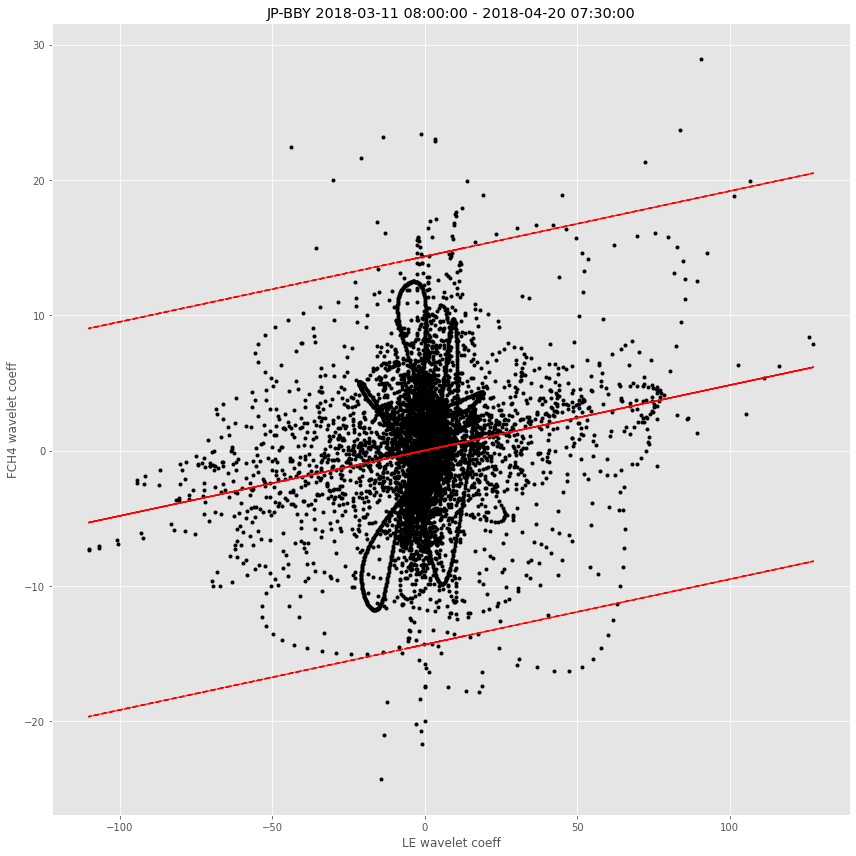

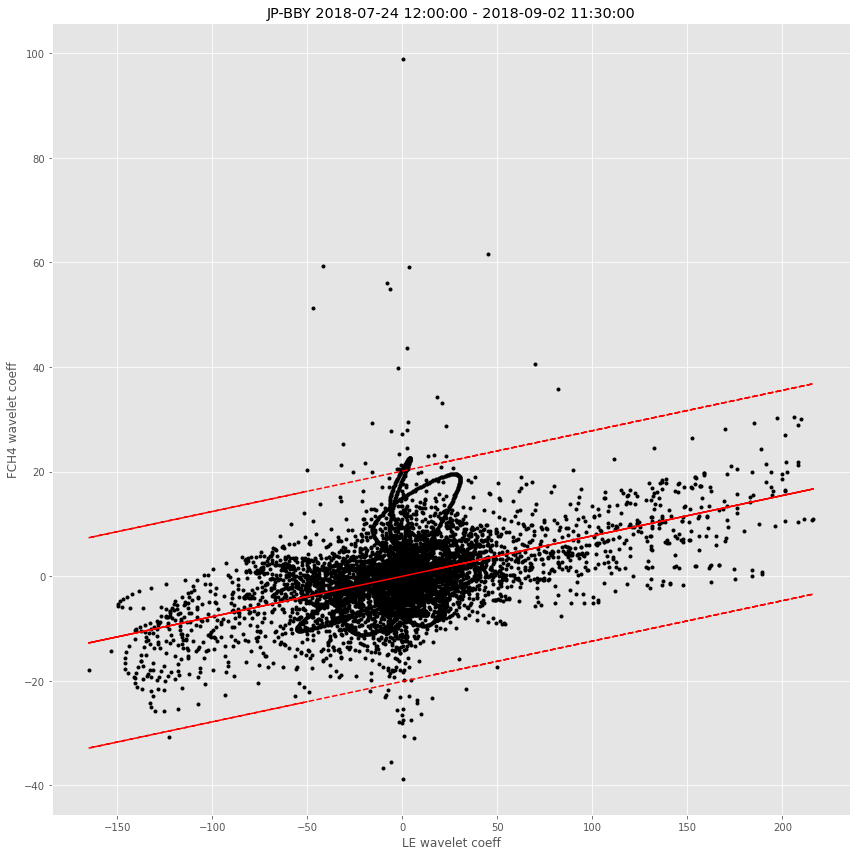

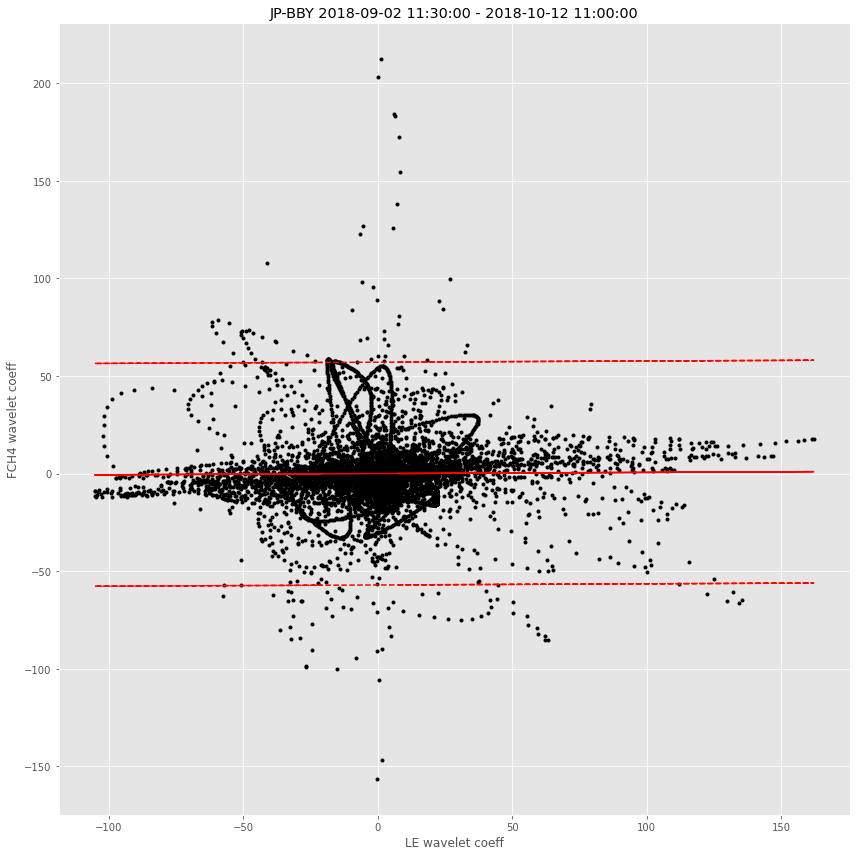

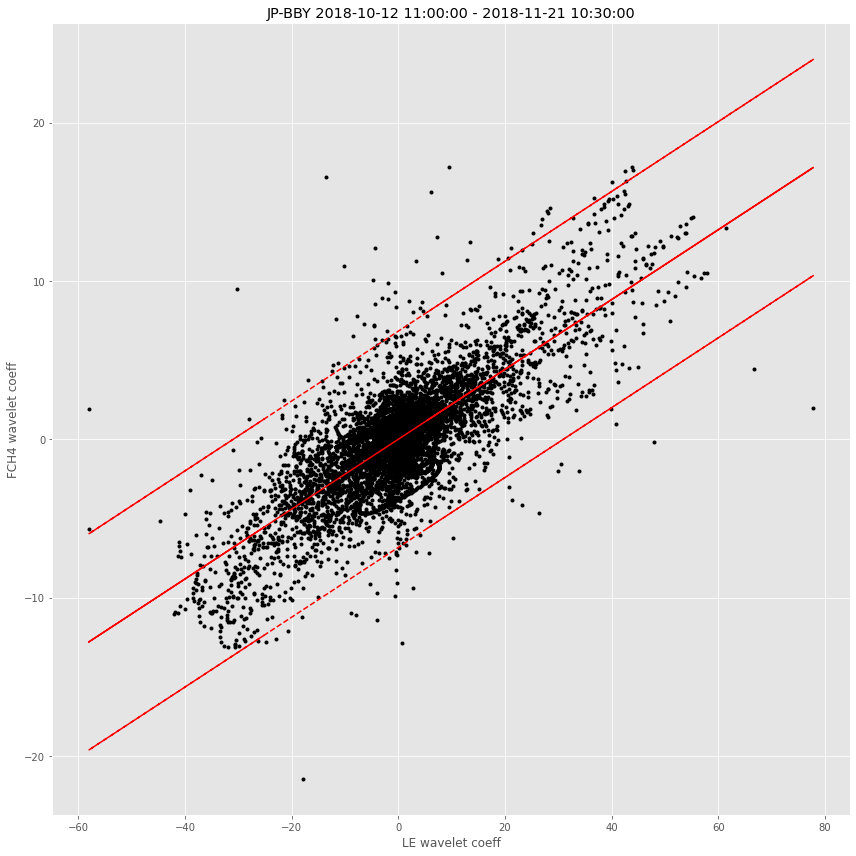

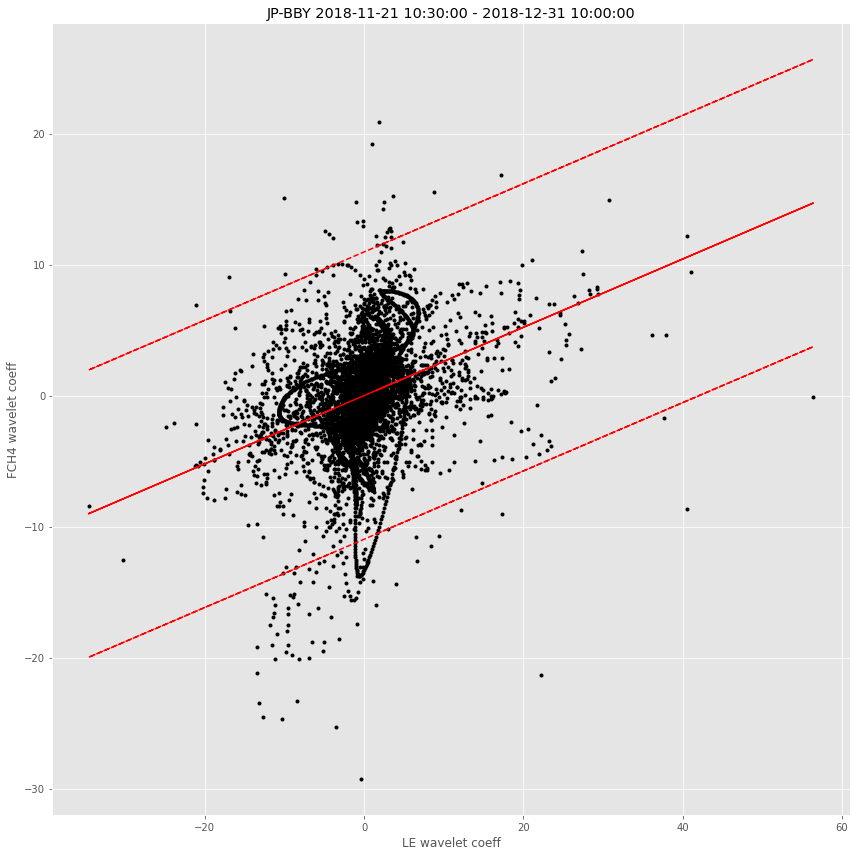

In [10]:
# Scales separated

for window in windows:
    dfw = df.loc[window, :]
    dfp = wave.proc(dfw)
    
    # choose columns for partitioning
    Xcols = dfp.columns[dfp.columns.str.startswith('LE_w')]
    Ycols = dfp.columns[dfp.columns.str.startswith('FCH4_w')]
    
    
    fig, ax = plt.subplots()
    
    for j in len(Xcols):
        # calc regression
        pred, [Xflat, Yflat], rmsd, r2 = wave.get_regr(dfp, Xcols[j], Ycols[j])
        
        # partition
        dfp = wave.part(dfp, pred, rmsd, r2)
    
    df.loc[dfw.index, 'rmsd'] = dfp.loc[:, 'rmsd'] # write back to df
    df.loc[dfw.index, 'r2'] = dfp.loc[:, 'r2'] # write back to df
    
#     filename = None
    filename = 'plot/20210716/20210716_{}_lump_iwata7_{}_{}.jpeg'.format(site_id, window[0].year, window[0].month)
    
    p.iwata7sep(Xflat, Yflat, pred, rmsd, xlabel='LE wavelet coeff', ylabel='FCH4 wavelet coeff', 
           title='{} {} - {}'.format(site_id, window[0], window[-1]), 
             filename = filename)
    
    

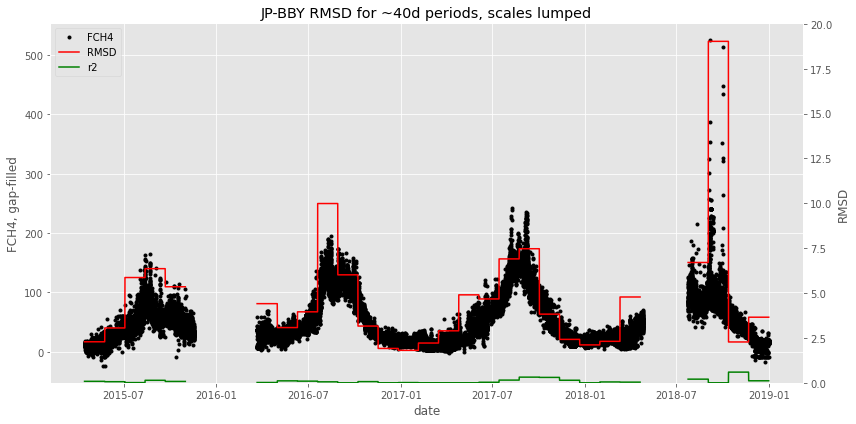

In [11]:
p.date_rmsd(df, title = '{} RMSD for ~40d periods, scales lumped'.format(site_id),
            filename='plot/20210716/20210716_{}_lump_rmsd_vs_date.jpeg'.format(site_id))

# 40 day intervals

1920 samples is shortest usable length for 7 level wavelet decomposition with LA8 wavelet  

- break timeseries into windows of 1920 samples (~40 days)
- choose 'low ebullition' period with low RMSD for reference
- partition other windows using ref RMSD

In [32]:
site_id = 'JP-BBY'

df = wave.read('FLX_{}'.format(site_id), method='file')

df = df.replace(-9999, np.nan) # replace missing with nan
df['date'] = pd.to_datetime(df['TIMESTAMP_START'], format='%Y%m%d%H%M') # parse timestamp to new column 'date'
df = df.set_index(df['date'])

<AxesSubplot:title={'center':'2015 - 2018 JP-BBY'}, xlabel='date', ylabel='FCH4, gap-filled'>

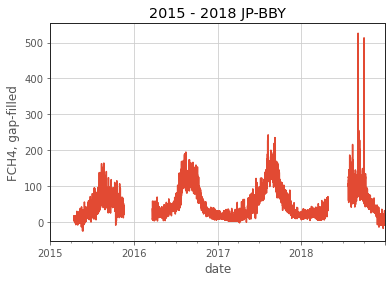

In [33]:
df['FCH4_F'].plot(ylabel = 'FCH4, gap-filled', 
                  title=f'{df.index[0].year} - {df.index[-1].year} {site_id}')

In [35]:
windows = wave.chop(df, 1920)

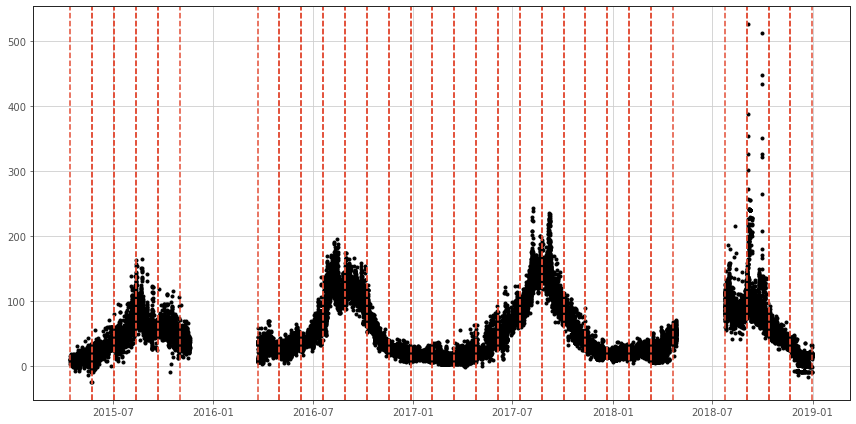

In [36]:
fig, ax = plt.subplots(figsize=(12,6))

ax.plot(df.index, df.loc[df.index, 'FCH4_F'], 'k.')
for w in windows:
    ax.axvline(w[0], ls='--')
    ax.axvline(w[-1], ls='--')

fig.tight_layout()

In [37]:
# Scales separated

for window in windows:
    dfw = df.loc[window, :]
    dfp = wave.proc(dfw, level=7, sum_scales=True)
    
    # choose columns for partitioning
    Xcols = dfp.columns[dfp.columns.str.startswith('LE_w')]
    Ycols = dfp.columns[dfp.columns.str.startswith('FCH4_w')]
    
    plt.close('all')
    fig, ax = plt.subplots(len(Xcols) // 2, 2, figsize=(12,12), sharex=True, sharey=True)
    
    bigax = fig.add_subplot(111, frameon=False)
    bigax.grid(False)
    bigax.tick_params(labelcolor='none', which='both', top=False, bottom=False,
                  left=False, right=False)

    bigax.set(xlabel='LE wavelet coeff', ylabel='FCH4 wavelet coeff', 
              title='{} {} - {}'.format(site_id, window[0], window[-1]))
        
    for j in range(len(Xcols)):
        
        # calc regression
        pred, rmsd, r2 = wave.get_regr(dfp, Xcols[j], Ycols[j])
        
        df.loc[dfp.index, 'pred_{}'.format(j)] = pred
        df.loc[dfp.index, 'rmsd_{}'.format(j)] = np.ones(len(dfp)) * rmsd
        df.loc[dfp.index, 'r2_{}'.format(j)] = np.ones(len(dfp)) * r2
        
        ax[j // 2, j % 2].plot(dfp[Xcols[j]], dfp[Ycols[j]], 'k.',
                               dfp[Xcols[j]], pred, 'r-', 
                               dfp[Xcols[j]], pred + 3 * rmsd, 'r--', 
                               dfp[Xcols[j]], pred - 3 * rmsd, 'r--')
    
    plt.tight_layout()

    filename = 'plot/20210819/no_sum/20210819_{}_iwata7_nosum_{}_{}.jpeg'.format(site_id, window[0].year, window[0].month)
#     plt.savefig(filename)
    
    df.loc[window, Xcols] = dfp[Xcols]
    df.loc[window, Ycols] = dfp[Ycols]

    plt.close()

In [41]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(df.loc[windows[-3]].cov()['FCH4_w0':'FCH4_w3'])

         TIMESTAMP_START  TIMESTAMP_END        NEE           H          LE  \
FCH4_w0    472858.441028  493992.784880  11.261835 -403.581507 -429.885418   
FCH4_w1    203405.567369  212482.663646  21.696793 -273.020853  213.858170   
FCH4_w2     13373.385865   94679.637752 -10.106146   72.139465   65.077315   
FCH4_w3     17337.632310   37388.292657   1.097931   32.388036   22.897484   

               FCH4     USTAR       SW_IN     SW_OUT       LW_IN     LW_OUT  \
FCH4_w0  467.254945  1.180619 -737.078198 -44.135094  212.868372  95.959230   
FCH4_w1  277.048522  0.111806  -92.610683 -48.093337   40.618876  52.221371   
FCH4_w2  899.125831  0.091450  230.281199  34.010005  -16.165142  16.522525   
FCH4_w3  683.600834  0.012176   31.391670   7.169246   -6.263909   2.333286   

             NETRAD     PPFD_IN       VPD        RH        PA         TA  \
FCH4_w0 -159.333964 -869.370204  1.197449  4.401056 -8.353123  18.185670   
FCH4_w1 -133.856617  113.413266  0.702842 -6.643262 -1.203114

<AxesSubplot:xlabel='date'>

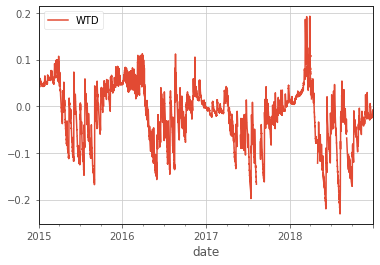

In [42]:
df.loc[:, ['WTD']].plot()

In [ ]:
df.loc[:, 'FCH4_F'].plot()

In [7]:
df = wave.partition(df, windows, rmsd=df.loc[windows[-2], 'rmsd_3'])

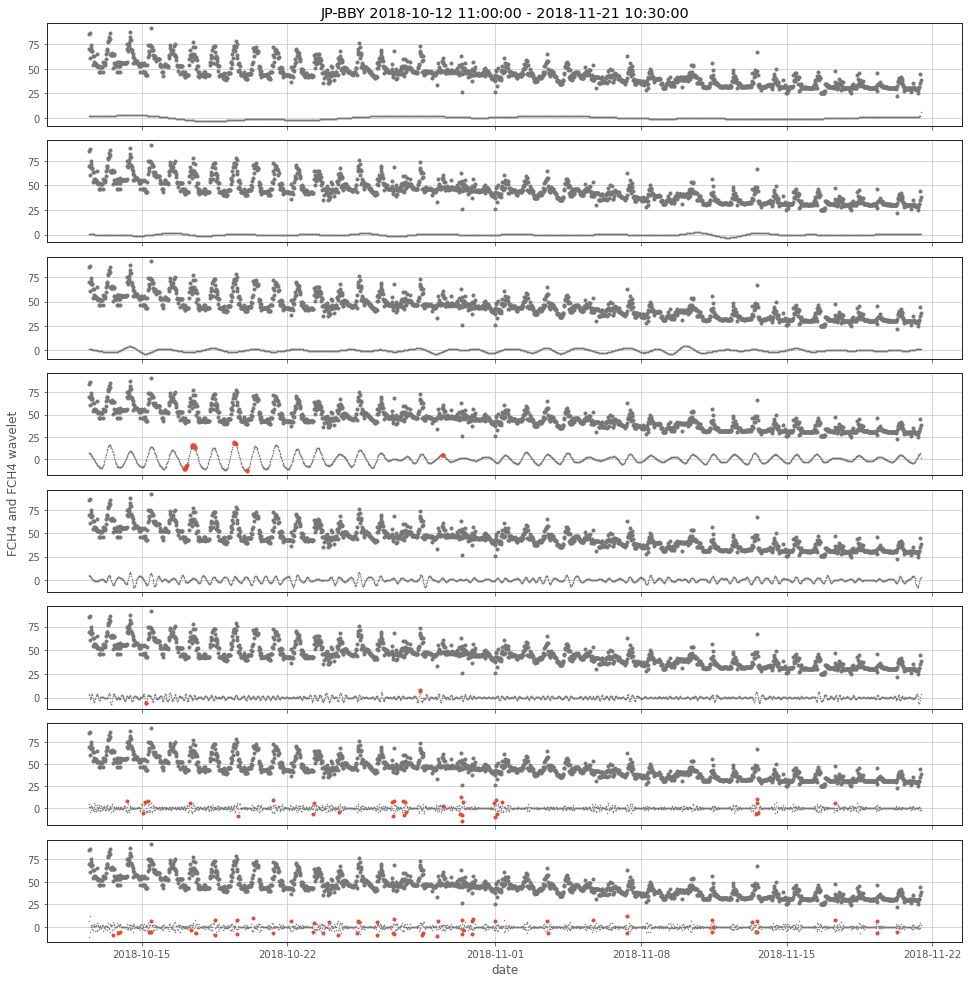

In [25]:
# Choose window and columns to plot
window = windows[-2]
dfw = df.loc[window]

cols = df.columns[df.columns.str.startswith('FCH4_w')]

# mask for ebullitive fluxes
mask = [dfw[f'ebull_{j}']==True for j in range(len(cols))]

plt.close('all')
fig, ax = plt.subplots(len(cols), 1, figsize=(14,14), sharex=True, sharey=False)

bigax = fig.add_subplot(111, frameon=False)
bigax.grid(False)
bigax.tick_params(labelcolor='none', which='both', top=False, bottom=False,
              left=False, right=False)
bigax.set(ylabel='FCH4 and FCH4 wavelet', title=f'{site_id} {window[0]} - {window[-1]}')

colors = list(plt.rcParams['axes.prop_cycle'])

for j in range(len(cols)):
    ax[j].plot(window, dfw[f'FCH4_F'], '.', color=colors[-1]['color'])
    ax[j].plot(window, dfw[f'FCH4_w{j}'], '.',color=colors[3]['color'], label='diffusive', markersize=1)
    ax[j].plot(dfw.loc[mask[j]].index, dfw.loc[dfw.loc[mask[j]].index, f'FCH4_w{j}'], '.', color = colors[0]['color'])
#     ax[j].plot(dfw.loc[dfw[f'ebull_{j}']==True].index, dfw.loc[dfw.loc[dfw[f'ebull_{j}']==True].index, f'FCH4_w{j}'], 'r.', label='ebullitive')

ax[-1].set(xlabel = 'date')

plt.tight_layout()

filename = f'plot/20210821/no_sum/20210821_FLX-BBY_{window[0].month}_partition_vs_FCH4.jpeg'
plt.savefig(filename)

plt.show()

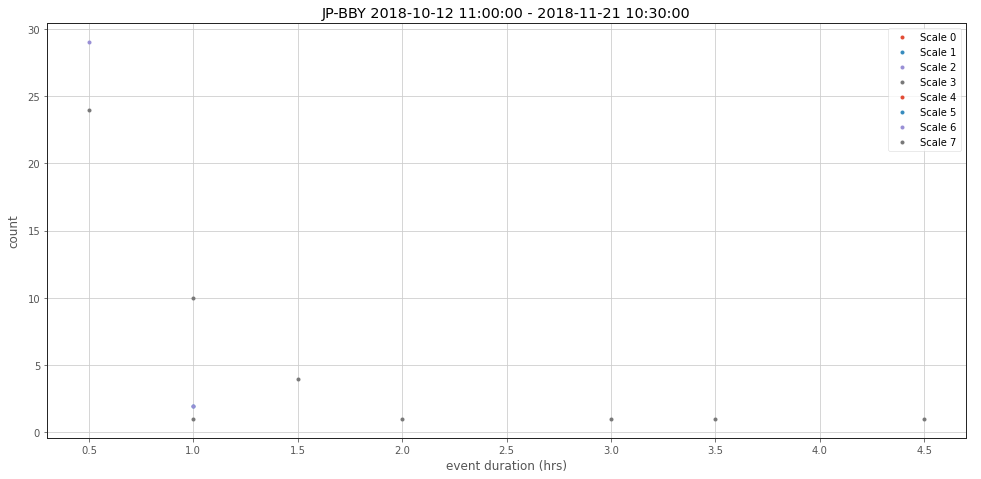

In [26]:
# event durations

fig, ax = plt.subplots(1, 1, figsize=(14,7), sharex=True, sharey=False)

bigax = fig.add_subplot(111, frameon=False)
bigax.grid(False)
bigax.tick_params(labelcolor='none', which='both', top=False, bottom=False,
              left=False, right=False)
bigax.set(xlabel='event duration (hrs)', ylabel='count', title=f'{site_id} {window[0]} - {window[-1]}')

colors = list(plt.rcParams['axes.prop_cycle'])

for j in range(len(cols)):
    df.loc[window, f'event_{j}'] = dfw[f'ebull_{j}'].diff().ne(0).cumsum()
    event_sizes = (df.loc[dfw.loc[mask[j]].index]
                   .groupby(f'event_{j}')
                   .size()
                   .apply(lambda x: x / 2.)
                  )
    ax.plot(event_sizes.value_counts(),
            '.', label = f'Scale {j}')
ax.legend()
# ax[-1].set(xlabel = 'date')

plt.tight_layout()

filename = f'plot/20210821/no_sum/20210821_FLX-BBY_{window[0].month}_event_durations.jpeg'
plt.savefig(filename)

plt.show()

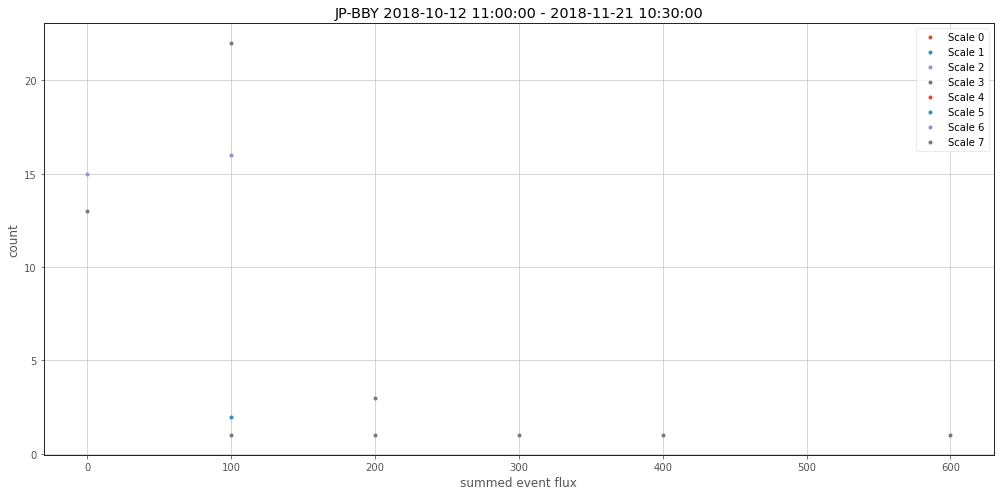

In [27]:

# event fluxes

fig, ax = plt.subplots(1, 1, figsize=(14,7), sharex=True, sharey=True)

# bigax = fig.add_subplot(111, frameon=False)
# bigax.grid(False)
# bigax.tick_params(labelcolor='none', which='both', top=False, bottom=False,
#               left=False, right=False)

ax.set(xlabel='summed event flux', ylabel='count', title=f'{site_id} {window[0]} - {window[-1]}')

colors = list(plt.rcParams['axes.prop_cycle'])

for j in range(len(cols)):
    events = dfw.loc[mask[j].index]
    df.loc[window, f'event_{j}'] = dfw[f'ebull_{j}'].diff().ne(0).cumsum()
    event_fluxes = (df.loc[dfw.loc[mask[j]].index]
                    .groupby(f'event_{j}')
                    .sum()
                    ['FCH4_F']
                    .round(-2)
                   )
    ax.plot(event_fluxes.value_counts(), '.',
           label = f'Scale {j}')
ax.legend()
# ax[-1].set(xlabel = 'date')

plt.tight_layout()

filename = f'plot/20210821/no_sum/20210821_FLX-BBY_{window[0].month}_event_fluxes.jpeg'
plt.savefig(filename)

plt.show()

### Summary stats for full timeseries

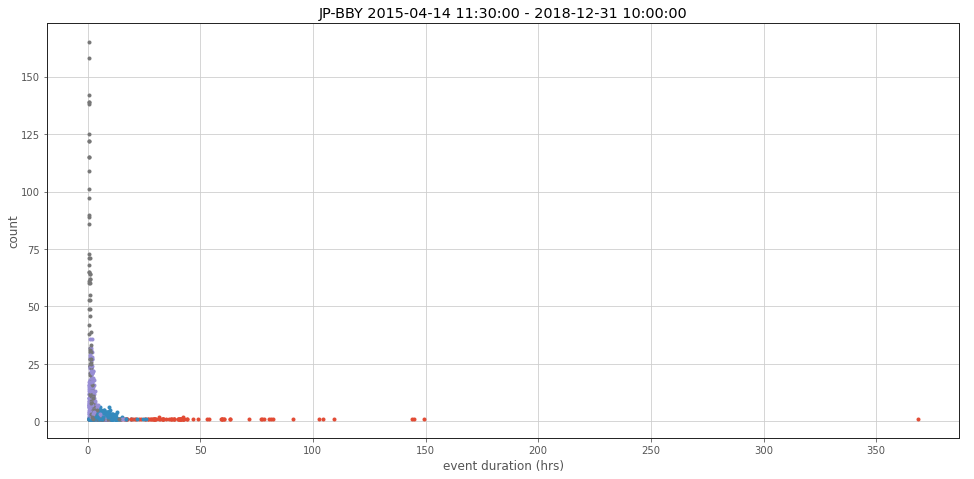

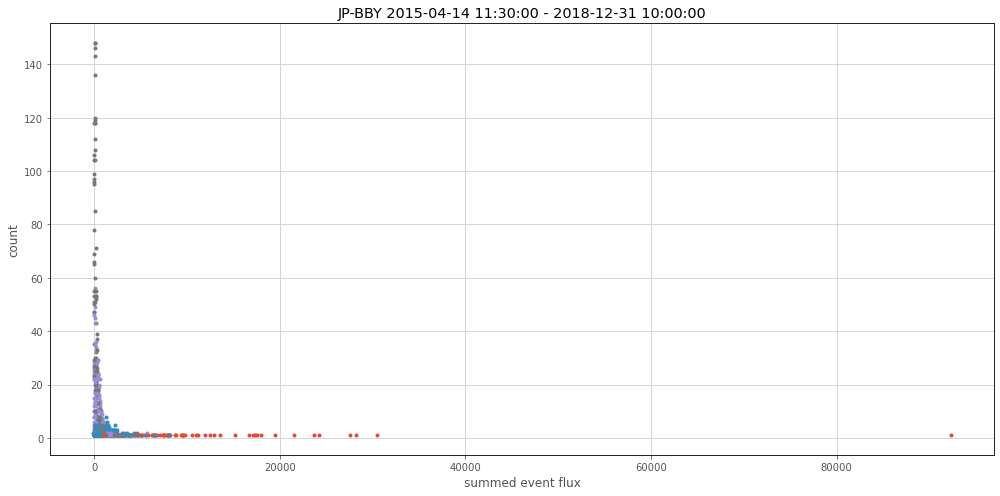

In [30]:
# event durations

fig, ax = plt.subplots(1, 1, figsize=(14,7), sharex=True, sharey=False)

bigax = fig.add_subplot(111, frameon=False)
bigax.grid(False)
bigax.tick_params(labelcolor='none', which='both', top=False, bottom=False,
              left=False, right=False)
bigax.set(xlabel='event duration (hrs)', ylabel='count', title=f'{site_id} {windows[0][0]} - {windows[-1][-1]}')

colors = list(plt.rcParams['axes.prop_cycle'])

for window in windows:
    dfw = df.loc[window]
    cols = df.columns[df.columns.str.startswith('FCH4_w')]

    # mask for ebullitive fluxes
    mask = [dfw[f'ebull_{j}']==True for j in range(len(cols))]

    for j in range(0, len(cols)):
        df.loc[window, f'event_{j}'] = dfw[f'ebull_{j}'].diff().ne(0).cumsum()
        event_sizes = (df.loc[dfw.loc[mask[j]].index]
                       .groupby(f'event_{j}')
                       .size()
                       .apply(lambda x: x / 2.)
                      )
        ax.plot(event_sizes.value_counts(),
                '.', label = f'Scale {j}')
# ax.legend()
# ax[-1].set(xlabel = 'date')

plt.tight_layout()

filename = 'plot/20210727/20210727_FLX-BBY_07_partition_vs_FCH4.jpeg'
# plt.savefig(filename)

plt.show()


# event fluxes

fig, ax = plt.subplots(1, 1, figsize=(14,7), sharex=True, sharey=True)

# bigax = fig.add_subplot(111, frameon=False)
# bigax.grid(False)
# bigax.tick_params(labelcolor='none', which='both', top=False, bottom=False,
#               left=False, right=False)

ax.set(xlabel='summed event flux', ylabel='count', title=f'{site_id} {windows[0][0]} - {windows[-1][-1]}')

colors = list(plt.rcParams['axes.prop_cycle'])

for window in windows:
    dfw = df.loc[window]
    cols = df.columns[df.columns.str.startswith('FCH4_w')]

    # mask for ebullitive fluxes
    mask = [dfw[f'ebull_{j}']==True for j in range(len(cols))]

    for j in range(0, len(cols)):
        events = dfw.loc[mask[j].index]
        df.loc[window, f'event_{j}'] = dfw[f'ebull_{j}'].diff().ne(0).cumsum()
        event_fluxes = (df.loc[dfw.loc[mask[j]].index]
                        .groupby(f'event_{j}')
                        .sum()
                        ['FCH4_F']
                        .round(-2)
                       )
        ax.plot(event_fluxes.value_counts(), '.',
               label = f'Scale {j}')
# ax.legend()
# ax[-1].set(xlabel = 'date')

plt.tight_layout()

filename = 'plot/20210727/20210727_FLX-BBY_07_partition_vs_FCH4.jpeg'
# plt.savefig(filename)

plt.show()

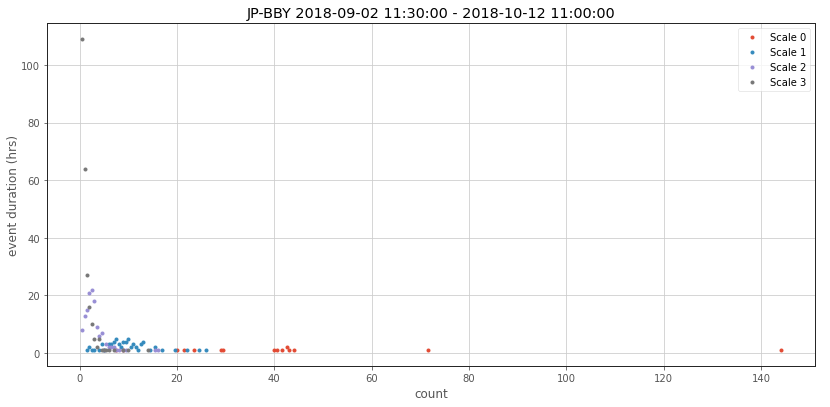

In [133]:
# Choose window and columns to plot
window = windows[-3]
dfw = df.loc[window]

cols = df.columns[df.columns.str.startswith('FCH4_w')]

# mask for ebullitive fluxes
mask = [dfw[f'ebull_{j}']==True for j in range(len(cols))]


plt.close('all')
fig, ax = plt.subplots(1, 1, figsize=(12,6), sharex=True, sharey=False)

bigax = fig.add_subplot(111, frameon=False)
bigax.grid(False)
bigax.tick_params(labelcolor='none', which='both', top=False, bottom=False,
              left=False, right=False)
bigax.set(ylabel='event duration (hrs)', xlabel='count', title=f'{site_id} {window[0]} - {window[-1]}')

colors = list(plt.rcParams['axes.prop_cycle'])

for j in range(len(cols)):
    df.loc[window, f'event_{j}'] = dfw[f'ebull_{j}'].diff().ne(0).cumsum()
    ax.plot((df.loc[dfw.loc[mask[j]].index].groupby(f'event_{j}').size() / 2.).value_counts(), '.',
           label = f'Scale {j}')
ax.legend()
# ax[-1].set(xlabel = 'date')

plt.tight_layout()

filename = 'plot/20210727/20210727_FLX-BBY_07_partition_vs_FCH4.jpeg'
# plt.savefig(filename)

plt.show()

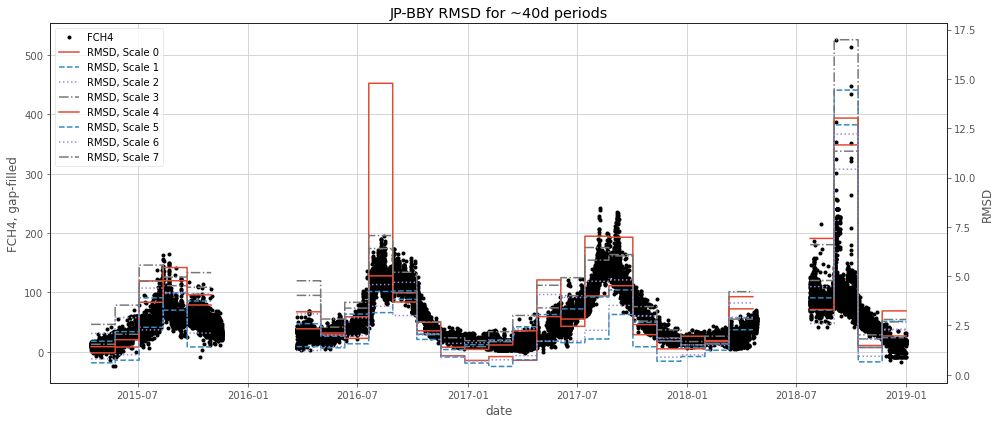

In [29]:
# filename = f'plot/20210719/20210719_{site_id}_sep_rmsd_vs_date.jpeg'
filename = None
p.date_rmsd(df, title = f'{site_id} RMSD for ~40d periods', 
            filename = filename,
            figsize=(14,6)
           )

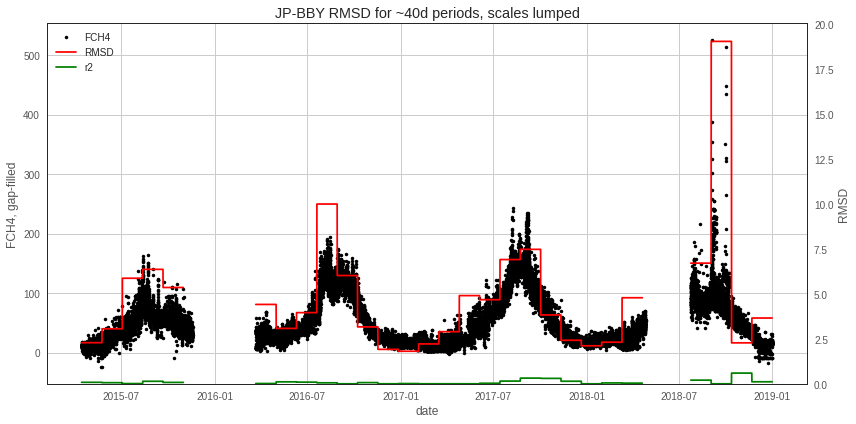

In [92]:
p.date_rmsd_lump(df, title = '{} RMSD for ~40d periods, scales lumped'.format(site_id),
                 filename='plot/20210716/20210716_{}_lump_rmsd_vs_date.jpeg'.format(site_id))

## JP-Swl

In [4]:
# df = wave.pd_read_from_drive('FLX_JP-BBY') # read from google drive into pd.DataFrame
# df = wave.read('FLX_JP-BBY', method='url')

site_id = 'JP-Swl'
df = wave.read('FLX_{}'.format(site_id), method='file')

In [5]:
df = df.replace(-9999, np.nan) # replace missing with nan
df['date'] = pd.to_datetime(df['TIMESTAMP_START'], format='%Y%m%d%H%M') # parse timestamp to new column 'date'
df = df.set_index(df['date'])

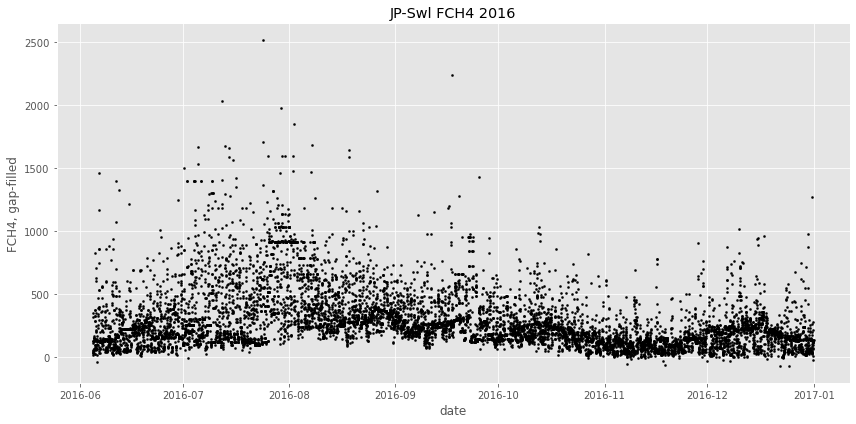

In [7]:
p.date(df.index, df['FCH4_F'], xlabel='date', ylabel='FCH4, gap-filled', title="{} FCH4 2016".format(site_id))

In [8]:
windows = wave.chop(df)

appending window 2016-06-04 16:30:00 to 2016-07-14 16:00:00 to windows
appending window 2016-07-14 16:00:00 to 2016-08-23 15:30:00 to windows
appending window 2016-08-23 15:30:00 to 2016-10-02 15:00:00 to windows
appending window 2016-10-02 15:00:00 to 2016-11-11 14:30:00 to windows
appending window 2016-11-11 14:30:00 to 2016-12-21 14:00:00 to windows


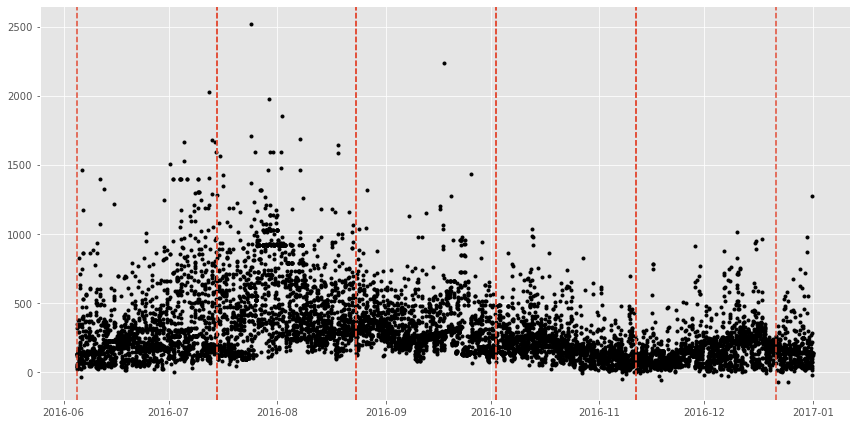

In [9]:
fig, ax = plt.subplots(figsize=(12,6))

ax.plot(df.index, df.loc[df.index, 'FCH4_F'], 'k.')
for w in windows:
    ax.axvline(w[0], ls='--')
    ax.axvline(w[-1], ls='--')

fig.tight_layout()

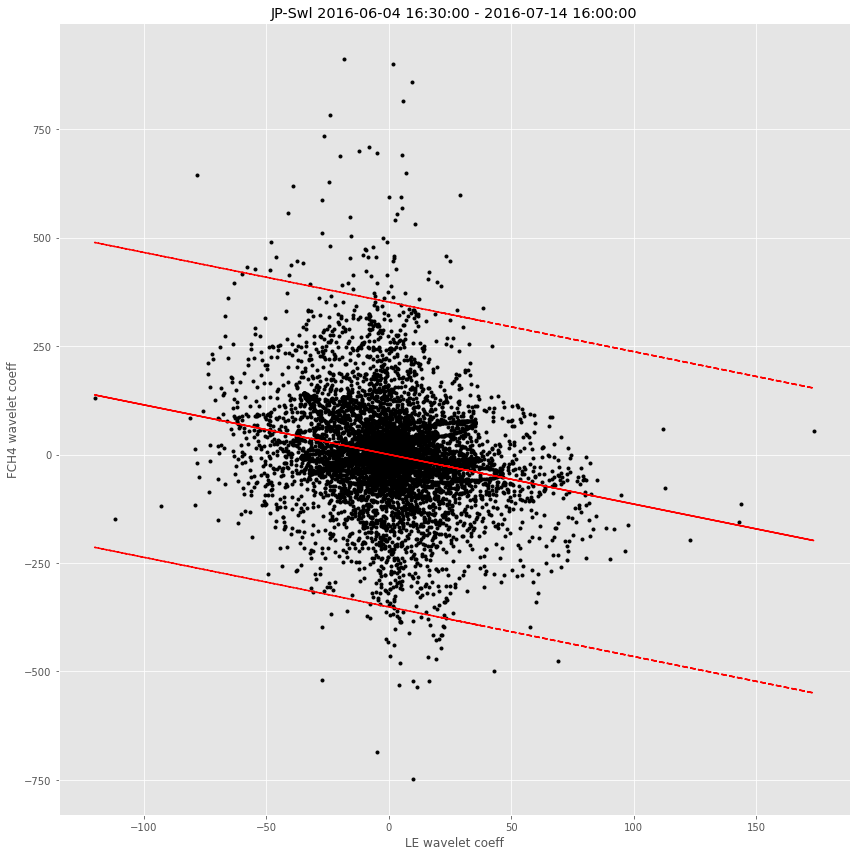

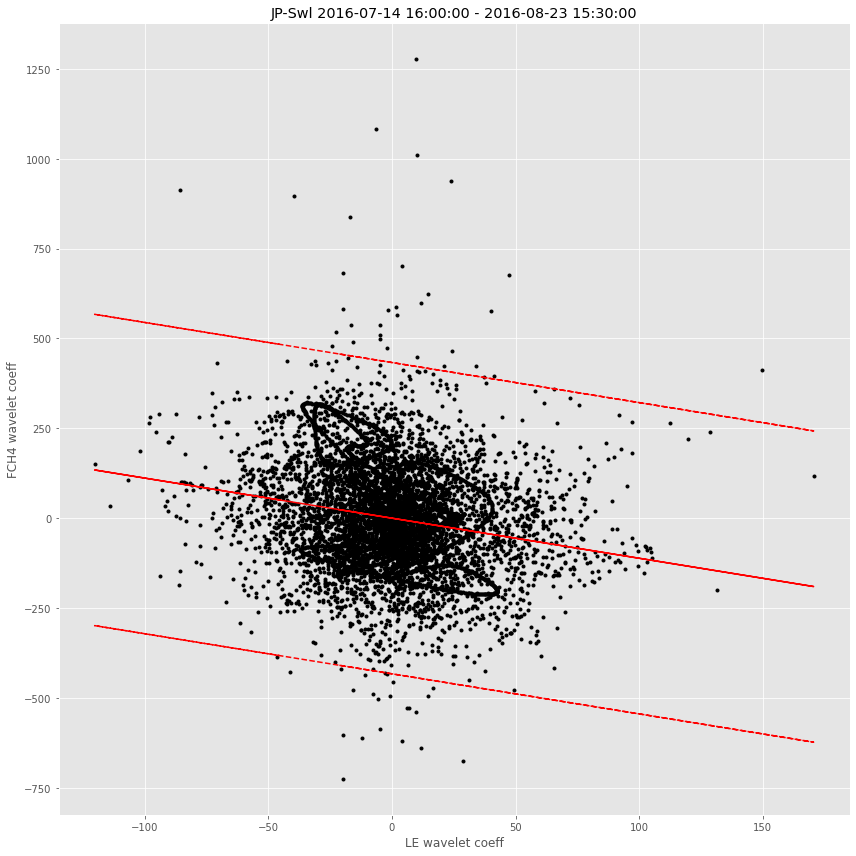

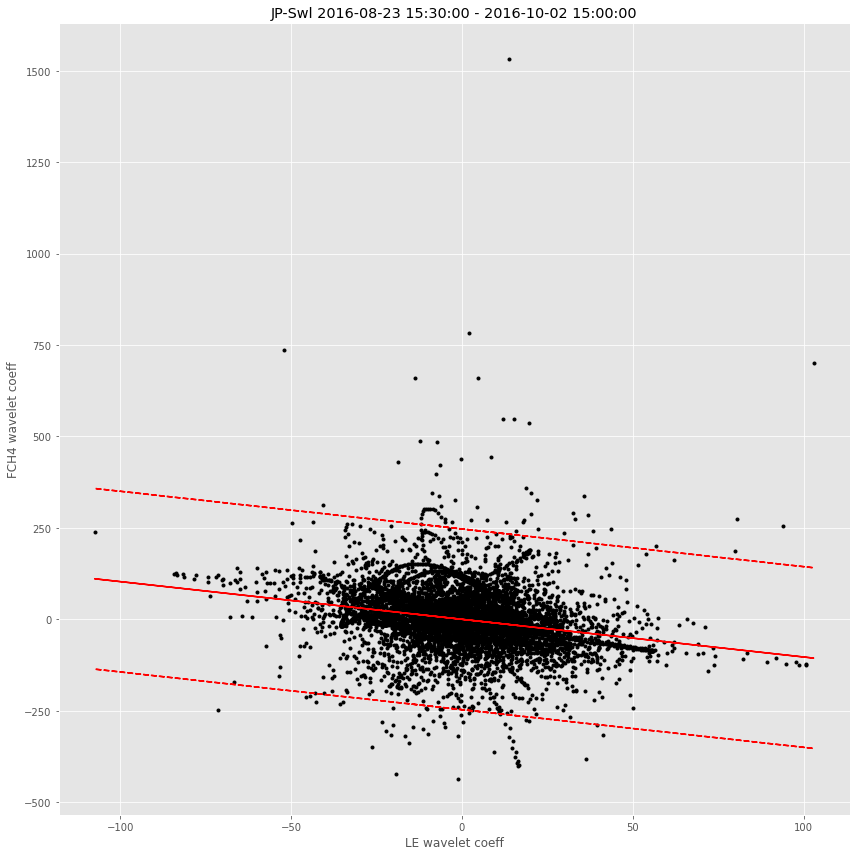

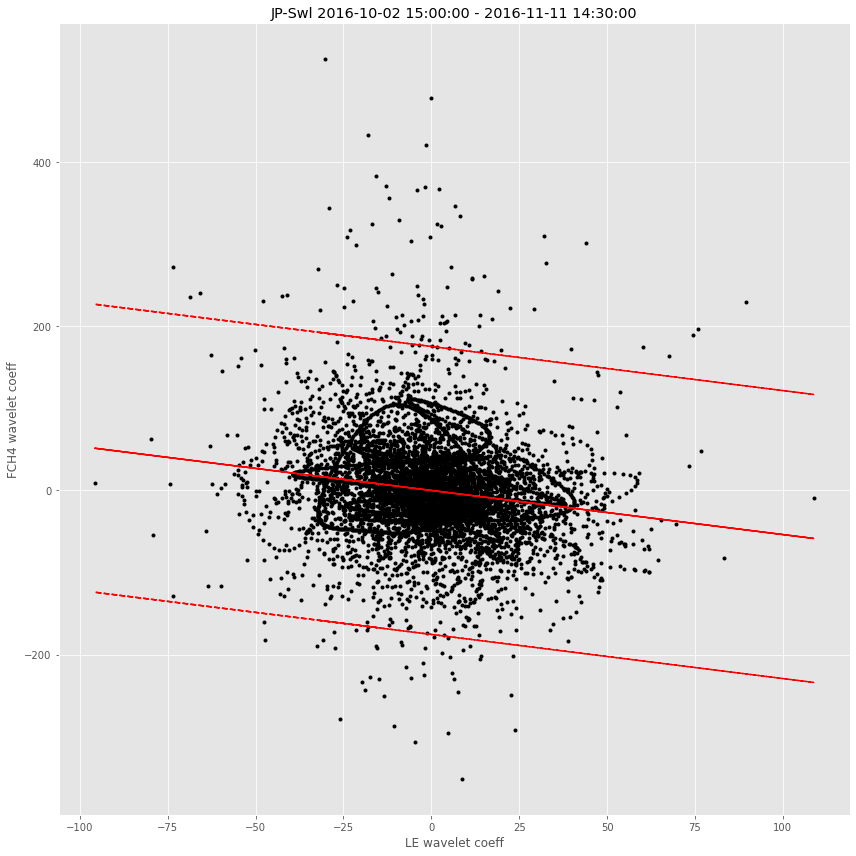

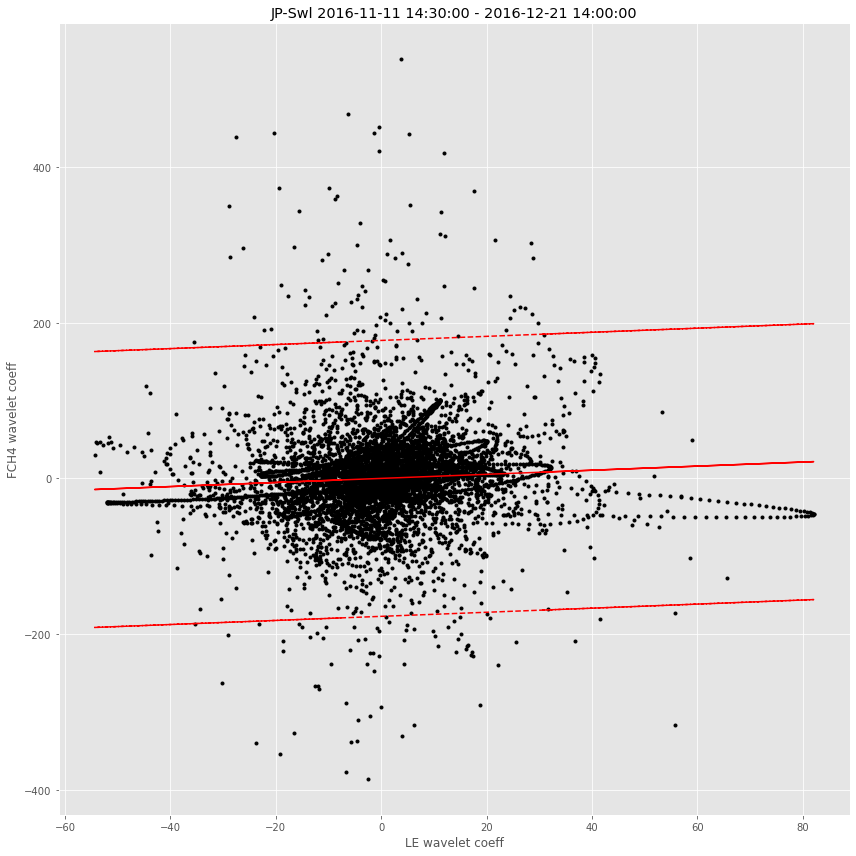

In [10]:
for window in windows:
    dfw = df.loc[window, :]
    dfp = wave.proc(dfw)
    
    # choose columns for partitioning
    Xcols = dfp.columns[dfp.columns.str.startswith('LE_w')]
    Ycols = dfp.columns[dfp.columns.str.startswith('FCH4_w')]
    
    # calc regression
    pred, [Xflat, Yflat], rmsd, r2 = wave.get_regr(dfp, Xcols, Ycols)
    
    # partition
    dfp = wave.part(dfp, pred, rmsd, r2)
    
#     filename = None
    filename = 'plot/20210716/20210716_{}_lump_iwata7_{}_{}.jpeg'.format(site_id, window[0].year, window[0].month)
    
    p.iwata7(Xflat, Yflat, pred, rmsd, xlabel='LE wavelet coeff', ylabel='FCH4 wavelet coeff', 
           title='{} {} - {}'.format(site_id, window[0], window[-1]), 
             filename = filename)
    
    df.loc[dfw.index, 'rmsd'] = dfp.loc[:, 'rmsd'] # write back to df
    df.loc[dfw.index, 'r2'] = dfp.loc[:, 'r2'] # write back to df

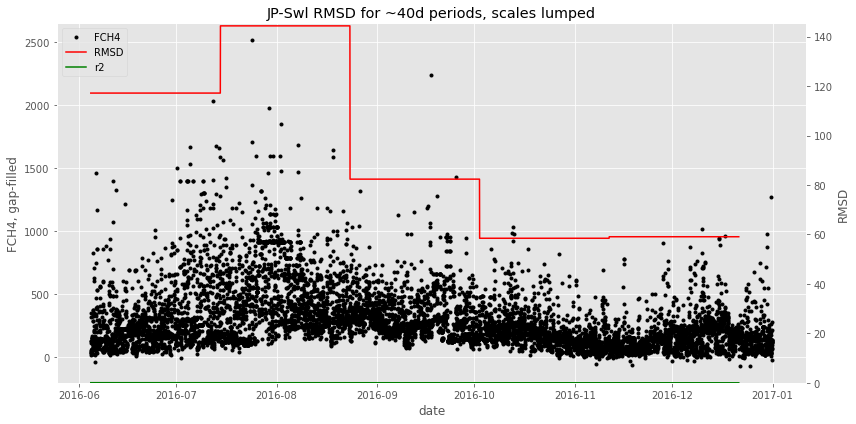

In [11]:
p.date_rmsd(df, title = '{} RMSD for ~40d periods, scales lumped'.format(site_id),
            filename='plot/20210716/20210716_{}_lump_rmsd_vs_date.jpeg'.format(site_id))

# junk junk

In [28]:

plt.close('all')
fig, ax = plt.subplots(len(cols), 1, figsize=(14,14), sharex=True, sharey=False)

bigax = fig.add_subplot(111, frameon=False)
bigax.grid(False)
bigax.tick_params(labelcolor='none', which='both', top=False, bottom=False,
              left=False, right=False)
bigax.set(ylabel='FCH4 and FCH4 wavelet', title=f'{site_id} {window[0]} - {window[-1]}')

colors = list(plt.rcParams['axes.prop_cycle'])

for j in range(len(cols)):
    df.loc[window, f'event_{j}'] = dfw[f'ebull_{j}'].diff().ne(0).cumsum()
    ax[j].plot(df.loc[dfw.loc[mask[j]].index].groupby(f'event_{j}').size() / 2.

ax[-1].set(xlabel = 'date')

plt.tight_layout()

filename = 'plot/20210727/20210727_FLX-BBY_07_partition_vs_FCH4.jpeg'
# plt.savefig(filename)

plt.show()

SyntaxError: invalid syntax (<ipython-input-28-02056ec20467>, line 16)

In [20]:
cols = df.columns[df.columns.str.startswith('FCH4_w')]
preds = df.columns[df.columns.str.startswith('pred_')]

In [41]:
maskless = df.loc[windows[0], cols].to_numpy() < df.loc[windows[0], preds].to_numpy() + 3 * rmsd

In [19]:
dfp.loc[window, 'FCH4_w0'] > dfp.loc[window, 'pred_0'] + 3 * dfp.loc[window, 'rmsd_0']

2018-11-21 10:30:00     True
2018-11-21 11:00:00    False
2018-11-21 11:30:00    False
2018-11-21 12:00:00    False
2018-11-21 12:30:00    False
                       ...  
2018-12-31 08:00:00    False
2018-12-31 08:30:00    False
2018-12-31 09:00:00    False
2018-12-31 09:30:00    False
2018-12-31 10:00:00    False
Freq: 30T, Length: 1920, dtype: bool